# Data Mining Project 2021 - 2022

## Group AB
#### Tomás Jordão M20210664
#### David Santos R20181082
#### Foazul Islam M20200750

**Table of Contents** <br>
* [1.Import Libraries](#importlibraries)
* [2.Import Dataset](#importdataset)
* [3. Data Exploration](#initialanalysis)
    * [3.1. Checking Incoherences](#chekingincoherences)
* [4. Pre-Processing](#preprocessing)
    * [4.1. Metric and Non-Metric Features](#metricnonmetric)
    * [4.2. Missing Values](#missingvalues)
    * [4.3. Filling Missing Values](#fillmissingvalues)
    * [4.4. Creating New Variables](#newvars)
    * [4.5. Relationship of Numerical Variables](#relationbetweenvars)
* [5. Outliers](#outliers)
    * [5.1. Checking for Outliers](#chekingoutliers)
    * [5.2. Removing Outliers by Experimentation](#removingoutliers1)
    * [5.3. Removing Outliers by Variables Distribution](#removingoutliers2)
    * [5.4. Removing Outliers with IQR](#removingoutliers3)
    * [5.5. Removing Outliers with Z-Score](#removingoutliers4)
    * [5.6. Removing Outliers with LOF](#removingoutliers5)
    * [5.7. Removing Outliers with OneClassSVM](#removingoutliers6)

* [6. Relevancy and Redundancy](#relandredun)
    * [6.1. Relation Between Variables](#relbetvars)
    * [6.2. Correlation](#correlation)
* [7. Normalization](#normalization)
* [8. One Hot Encoding](#ohc)
* [9. PCA](#pca)
* [10. Cluestering](#clustering)
    * [10.1. Clutering - All Features](#allfeatures)
    * [10.2. K-Means - PCA](#kmeanspca)
    * [10.3. K-Means - Different Perspectives](#kmeans)
    * [10.4. Cluster Visualization with t-SNE - K-Means All Features](#kmeansall)
    * [10.5. Classification of Outliers](#kmeansclass)



<hr>
<a class="anchor" id="importlibraries">
    
# 1. Import libraries
    
</a>

In [1]:
#importing the necessary libraries
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil
from datetime import datetime
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
import matplotlib.cm as cm
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.base import clone
from sklearn.manifold import TSNE
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split


#outliers
from scipy import stats
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM

from itertools import product
from pandas_profiling import ProfileReport

#Clustering
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import KMeans
from sklearn.cluster import MeanShift, DBSCAN, estimate_bandwidth
from sklearn.mixture import GaussianMixture

%matplotlib inline

%config InlineBackend.figure_format = 'retina' 

<hr>
<a class="anchor" id="importdataset">
    
# 2. Import Dataset
    
</a>

In [2]:
data = pd.read_sas('a2z_insurance.sas7bdat')

<hr>
<a class="anchor" id="initialanalysis">
    
# 3. Data Exploration
    
</a>

In [3]:
data.set_index('CustID', inplace = True)

In [4]:
data.head()

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
1.0,1985.0,1982.0,b'2 - High School',2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2.0,1981.0,1995.0,b'2 - High School',677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3.0,1991.0,1970.0,b'1 - Basic',2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4.0,1990.0,1981.0,b'3 - BSc/MSc',1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5.0,1986.0,1973.0,b'3 - BSc/MSc',1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 10296 entries, 1.0 to 10296.0
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   FirstPolYear   10266 non-null  float64
 1   BirthYear      10279 non-null  float64
 2   EducDeg        10279 non-null  object 
 3   MonthSal       10260 non-null  float64
 4   GeoLivArea     10295 non-null  float64
 5   Children       10275 non-null  float64
 6   CustMonVal     10296 non-null  float64
 7   ClaimsRate     10296 non-null  float64
 8   PremMotor      10262 non-null  float64
 9   PremHousehold  10296 non-null  float64
 10  PremHealth     10253 non-null  float64
 11  PremLife       10192 non-null  float64
 12  PremWork       10210 non-null  float64
dtypes: float64(12), object(1)
memory usage: 1.1+ MB


<hr>
<a class="anchor" id="chekingincoherences">
    
# 3.1. Cheking Incoherences
    
</a>

In [6]:
# checking for incoherences
min_age = min(data.BirthYear)
max_age = max(data.BirthYear)
print(min_age)
print(max_age)

1028.0
2001.0


In [7]:
# checking for people with over 100 years
data[data.BirthYear < 1916]
# remove this observation

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
7196.0,1993.0,1028.0,b'3 - BSc/MSc',2830.0,4.0,0.0,146.02,0.77,428.97,192.8,108.91,1.89,23.67


In [9]:
# percentage of the data where age is smaller than number of years as a customer
(sum(data.BirthYear > data.FirstPolYear) / data.shape[0]) * 100

19.395881895881896

In [10]:
# checking the youngest people
data[data.BirthYear == 2001]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
660.0,1991.0,2001.0,b'1 - Basic',1284.0,4.0,1.0,243.50,0.81,46.23,1079.65,72.68,252.27,-10.00
690.0,1997.0,2001.0,b'1 - Basic',1180.0,3.0,1.0,436.10,0.48,54.90,406.20,65.79,112.02,256.05
866.0,1979.0,2001.0,b'1 - Basic',562.0,1.0,1.0,1113.78,0.11,40.34,847.95,94.24,178.70,112.13
1437.0,1989.0,2001.0,b'1 - Basic',823.0,4.0,0.0,281.28,0.60,129.58,177.80,58.01,176.70,218.15
2580.0,1986.0,2001.0,b'1 - Basic',1006.0,4.0,0.0,267.95,0.67,48.23,396.75,291.50,127.58,24.45
3147.0,1994.0,2001.0,b'1 - Basic',372.0,4.0,1.0,488.76,0.36,60.68,270.60,177.59,182.48,107.13
4466.0,1978.0,2001.0,b'1 - Basic',958.0,4.0,0.0,-204.59,1.11,28.56,1359.15,68.79,38.23,179.59
4484.0,1983.0,2001.0,b'1 - Basic',1241.0,3.0,1.0,909.17,0.13,43.34,589.55,142.47,121.80,179.48
5348.0,1980.0,2001.0,b'1 - Basic',1119.0,3.0,1.0,796.71,0.23,148.14,628.45,221.82,45.12,30.23


In [11]:
# checking the caracheteristics of the people in the incoherence 
data[data.BirthYear > data.FirstPolYear].describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
FirstPolYear,1997.0,NaN,NaN,NaN,1982.228843,5.531945,1974.0,1978.0,1981.0,1986.0,1998.0
BirthYear,1997.0,NaN,NaN,NaN,1990.629444,5.747256,1975.0,1986.0,1991.0,1995.0,2001.0
EducDeg,1996,4,b'2 - High School',685,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MonthSal,1985.0,NaN,NaN,NaN,1332.64131,875.566802,333.0,985.0,1290.0,1640.0,34490.0
GeoLivArea,1997.0,NaN,NaN,NaN,2.69354,1.274155,1.0,1.0,3.0,4.0,4.0
Children,1994.0,NaN,NaN,NaN,0.830993,0.374852,0.0,1.0,1.0,1.0,1.0
CustMonVal,1997.0,NaN,NaN,NaN,246.387336,445.110036,-10107.37,-1.33,187.25,436.1,2054.07
ClaimsRate,1997.0,NaN,NaN,NaN,0.711427,0.512061,0.0,0.42,0.73,0.97,13.9
PremMotor,1989.0,NaN,NaN,NaN,177.667783,122.510217,-4.11,71.57,149.36,264.16,542.99
PremHousehold,1997.0,NaN,NaN,NaN,375.757762,327.50224,-75.0,122.25,285.6,564.55,2223.75


In [12]:
# removing the variables
data.drop(columns = ['FirstPolYear', 'BirthYear'], inplace = True )

<hr>
<a class="anchor" id="preprocessing">
    
# 4. Pre-processing
    
</a>

<hr>
<a class="anchor" id="metricnonmetric">
    
# 4.1. Metric and Non-Metric Features
    
</a>

In [13]:
non_metric_features = ["EducDeg", "Children", "GeoLivArea"]
metric_features = data.columns.drop(non_metric_features).to_list()

<hr>
<a class="anchor" id="missingvalues">
    
# 4.2. Missing Values
    
</a>

In [14]:
#cheking for missing values
data.isna().sum()
#multiple variables with missing values

EducDeg           17
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          86
dtype: int64

<hr>
<a class="anchor" id="fillmissingvalues">
    
# 4.3. Filling Missing Values
    
</a>

In [15]:
#filling metric features with the median
data.fillna(data.median(), inplace=True)
#filling non-metric features with the mode
data.fillna(data[non_metric_features].mode().loc[0], inplace=True)

data.isna().sum()  # checking how many NaNs we still have

EducDeg          0
MonthSal         0
GeoLivArea       0
Children         0
CustMonVal       0
ClaimsRate       0
PremMotor        0
PremHousehold    0
PremHealth       0
PremLife         0
PremWork         0
dtype: int64

In [16]:
# checking the distribution of the variables
data.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
EducDeg,10296,4,b'3 - BSc/MSc',4816,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MonthSal,10296.0,NaN,NaN,NaN,2506.64899,1155.424192,333.0,1708.5,2501.5,3289.0,55215.0
GeoLivArea,10296.0,NaN,NaN,NaN,2.709887,1.266232,1.0,1.0,3.0,4.0,4.0
Children,10296.0,NaN,NaN,NaN,0.707362,0.454996,0.0,0.0,1.0,1.0,1.0
CustMonVal,10296.0,NaN,NaN,NaN,177.892605,1945.811505,-165680.42,-9.44,186.87,399.7775,11875.89
ClaimsRate,10296.0,NaN,NaN,NaN,0.742772,2.916964,0.0,0.39,0.72,0.98,256.2
PremMotor,10296.0,NaN,NaN,NaN,300.464109,211.564802,-4.11,191.3425,298.61,407.52,11604.42
PremHousehold,10296.0,NaN,NaN,NaN,210.431192,352.595984,-75.0,49.45,132.8,290.05,25048.8
PremHealth,10296.0,NaN,NaN,NaN,171.544203,295.786857,-2.11,111.91,162.81,218.9575,28272.0
PremLife,10296.0,NaN,NaN,NaN,41.691178,47.268297,-7.0,9.89,25.56,57.01,398.3


In [17]:
# #correcting the variables types
data.Children = data.Children.astype("boolean")  

In [18]:
data.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
EducDeg,10296,4,b'3 - BSc/MSc',4816,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MonthSal,10296.0,NaN,NaN,NaN,2506.64899,1155.424192,333.0,1708.5,2501.5,3289.0,55215.0
GeoLivArea,10296.0,NaN,NaN,NaN,2.709887,1.266232,1.0,1.0,3.0,4.0,4.0
Children,10296,2,True,7283,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CustMonVal,10296.0,NaN,NaN,NaN,177.892605,1945.811505,-165680.42,-9.44,186.87,399.7775,11875.89
ClaimsRate,10296.0,NaN,NaN,NaN,0.742772,2.916964,0.0,0.39,0.72,0.98,256.2
PremMotor,10296.0,NaN,NaN,NaN,300.464109,211.564802,-4.11,191.3425,298.61,407.52,11604.42
PremHousehold,10296.0,NaN,NaN,NaN,210.431192,352.595984,-75.0,49.45,132.8,290.05,25048.8
PremHealth,10296.0,NaN,NaN,NaN,171.544203,295.786857,-2.11,111.91,162.81,218.9575,28272.0
PremLife,10296.0,NaN,NaN,NaN,41.691178,47.268297,-7.0,9.89,25.56,57.01,398.3


<hr>
<a class="anchor" id="newvars">
    
# 4.4. Creating New Variables
    
</a>

In [19]:
# It is created a new dataframe so that any change does not affect the original data
df = data.copy()

In [20]:
#Feature Engeneering
# avg_spend_premiuns - average spend on premiuns 
df['Avg_Premiuns'] = (df['PremHousehold']+df['PremHealth']+df['PremLife']+df['PremWork'] + df['PremMotor']) / 5


In [21]:
# checking if everything is correct
df.head()

,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns
CustID,,,,,,,,,,,,
1.0,b'2 - High School',2177.0,1.0,True,380.97,0.39,375.85,79.45,146.36,47.01,16.89,133.112
2.0,b'2 - High School',677.0,4.0,True,-131.13,1.12,77.46,416.20,116.69,194.48,106.13,182.192
3.0,b'1 - Basic',2277.0,3.0,False,504.67,0.28,206.15,224.50,124.58,86.35,99.02,148.120
4.0,b'3 - BSc/MSc',1099.0,4.0,True,-16.99,0.99,182.48,43.35,311.17,35.34,28.34,120.136
5.0,b'3 - BSc/MSc',1763.0,4.0,True,35.23,0.90,338.62,47.80,182.59,18.78,41.45,125.848


In [22]:
#adding the new variable to the metric features
metric_features.append('Avg_Premiuns')
metric_features

['MonthSal',
 'CustMonVal',
 'ClaimsRate',
 'PremMotor',
 'PremHousehold',
 'PremHealth',
 'PremLife',
 'PremWork',
 'Avg_Premiuns']

In [23]:
# confirmation that everything is correct with the data types
df.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 10296 entries, 1.0 to 10296.0
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   EducDeg        10296 non-null  object 
 1   MonthSal       10296 non-null  float64
 2   GeoLivArea     10296 non-null  float64
 3   Children       10296 non-null  boolean
 4   CustMonVal     10296 non-null  float64
 5   ClaimsRate     10296 non-null  float64
 6   PremMotor      10296 non-null  float64
 7   PremHousehold  10296 non-null  float64
 8   PremHealth     10296 non-null  float64
 9   PremLife       10296 non-null  float64
 10  PremWork       10296 non-null  float64
 11  Avg_Premiuns   10296 non-null  float64
dtypes: boolean(1), float64(10), object(1)
memory usage: 985.4+ KB


In [24]:
# distribution of the variables after the filling of missing values and creation of new variables
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
EducDeg,10296,4,b'3 - BSc/MSc',4816,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MonthSal,10296.0,NaN,NaN,NaN,2506.64899,1155.424192,333.0,1708.5,2501.5,3289.0,55215.0
GeoLivArea,10296.0,NaN,NaN,NaN,2.709887,1.266232,1.0,1.0,3.0,4.0,4.0
Children,10296,2,True,7283,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CustMonVal,10296.0,NaN,NaN,NaN,177.892605,1945.811505,-165680.42,-9.44,186.87,399.7775,11875.89
ClaimsRate,10296.0,NaN,NaN,NaN,0.742772,2.916964,0.0,0.39,0.72,0.98,256.2
PremMotor,10296.0,NaN,NaN,NaN,300.464109,211.564802,-4.11,191.3425,298.61,407.52,11604.42
PremHousehold,10296.0,NaN,NaN,NaN,210.431192,352.595984,-75.0,49.45,132.8,290.05,25048.8
PremHealth,10296.0,NaN,NaN,NaN,171.544203,295.786857,-2.11,111.91,162.81,218.9575,28272.0
PremLife,10296.0,NaN,NaN,NaN,41.691178,47.268297,-7.0,9.89,25.56,57.01,398.3


<hr>
<a class="anchor" id="relationbetweenvars">
    
# 4.5. Relationship of Numerical Variables
    
</a>

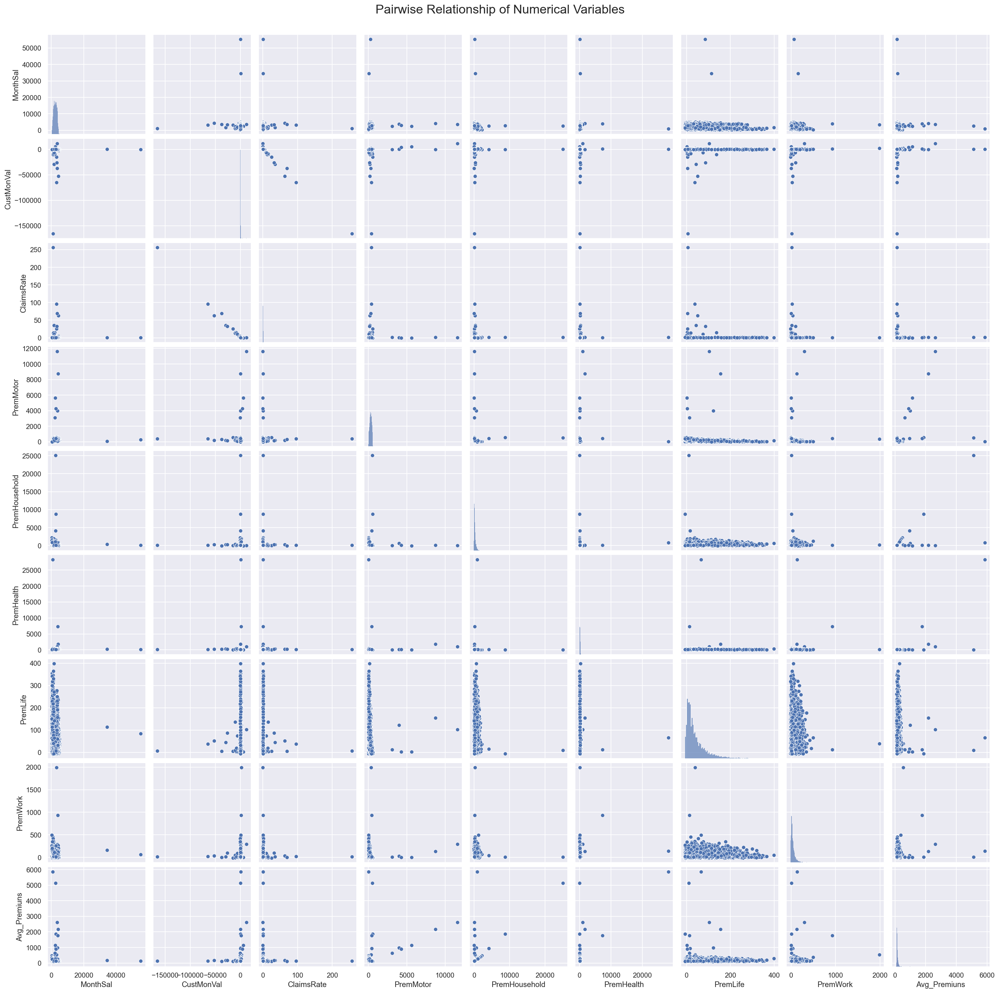

In [26]:
# Pairwise Relationship of Numerical Variables
sns.set()

# Setting pairplot
sns.pairplot(df[metric_features], diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

plt.show()

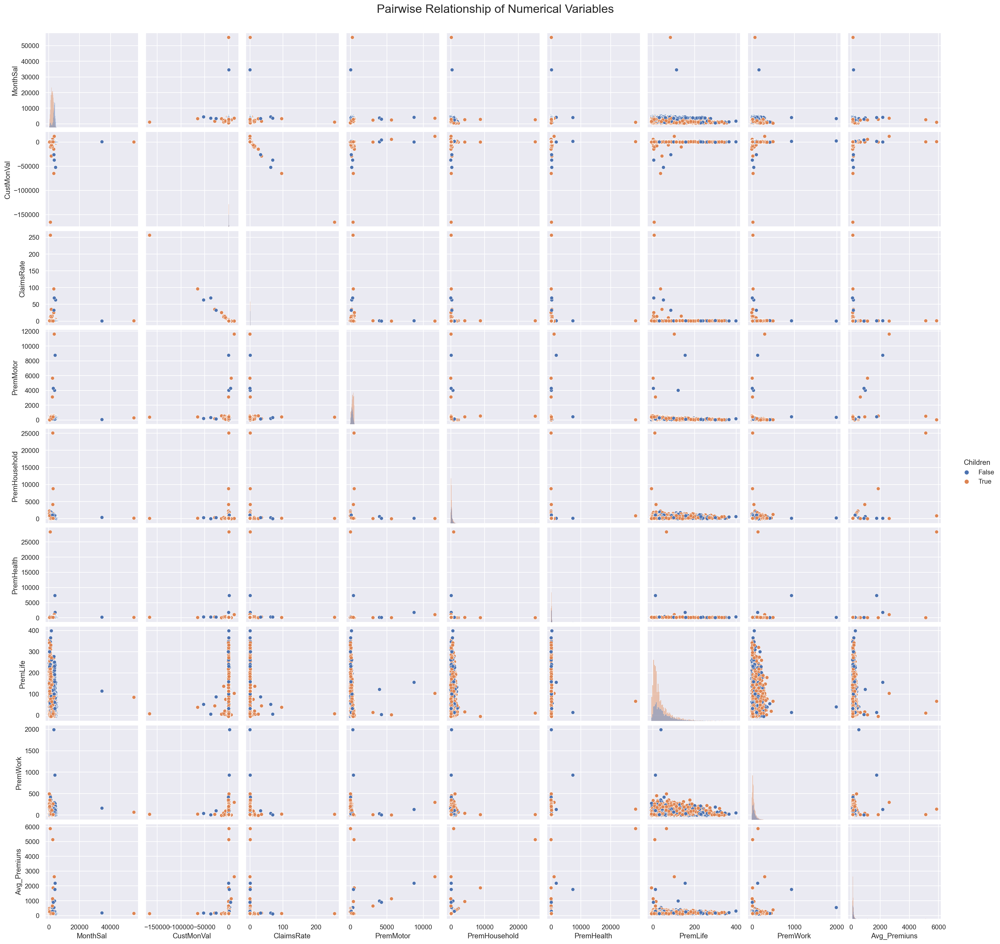

In [27]:
# Pairwise Relationship of Numerical Variables considering if they have children or not
sns.set()

# Setting pairplot
sns.pairplot(df[metric_features + ['Children']], diag_kind="hist", hue='Children')

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

plt.show()

<hr>
<a class="anchor" id="outliers">
    
# 5. Outliers
    
</a>

<hr>
<a class="anchor" id="chekingoutliers">
    
# 5.1. Checking for Outliers
    
</a>

In [25]:
# checking the values of the variables
# some of this thresholds are can be disputed because of the type of variables
#salary
df[df.MonthSal > 5500] # 5500 parece-me ser um bom threshold
# Customer Value
df[df.CustMonVal > 2100] # 2100 parece-me ser um bom threshold, mas serão verdadeiros outliers
df[df.CustMonVal < -10500] # 2100 parece-me ser um bom threshold, mas serão verdadeiros outliers
#Claims Rate
df[df.ClaimsRate > 50] # 50 parece-me ser um bom threshold
#PremMotor
df[df.PremMotor > 700] # 700 parece-me ser um bom threshold
# PremHouseHold
df[df.PremHousehold > 2500] # 2500 parece-me ser um bom threshold
#PremLife
df[df.PremLife > 370] # 370 parece-me ser um bom threshold
# PremWork
df[df.PremWork > 500] # 500 parece-me ser um bom threshold
# PremHealth
df[df.PremHealth > 460] # 460  parece-me ser um bom threshold





,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns
CustID,,,,,,,,,,,,
5212.0,b'2 - High School',4135.0,3.0,False,130.14,0.99,8744.61,101.70,1767.00,155.14,130.58,2179.806
5294.0,b'3 - BSc/MSc',3564.0,3.0,True,11875.89,0.09,11604.42,48.90,1045.52,103.13,296.47,2619.688
7962.0,b'3 - BSc/MSc',4002.0,3.0,False,1457.99,0.83,431.86,107.80,7322.48,12.89,930.44,1761.094
9150.0,b'2 - High School',987.0,3.0,True,804.05,0.97,26.34,829.05,28272.00,65.68,138.25,5866.264


<hr>
<a class="anchor" id="removingoutliers1">
    
# 5.2. Removing Outliers by Experimentation
    
</a>

In [26]:
# this first filtering is done by experimentation of the values of the variables
df_filter1 = df.loc[
    (df.MonthSal <= 5500)
    &
    (df.CustMonVal <= 2100)
    &
    (df.CustMonVal >= -5000)
    &
    (df.ClaimsRate <= 50)
    &
    (df.PremMotor <= 700)
    &
    (df.PremHousehold <= 2500)
    &
    (df.PremLife <= 370)
    &
    (df.PremWork <= 500)
    &
    (df.PremHealth <= 460)
]

<hr>
<a class="anchor" id="removingoutliers2">
    
# 5.3. Removing Outliers by Variables Distribution
    
</a>

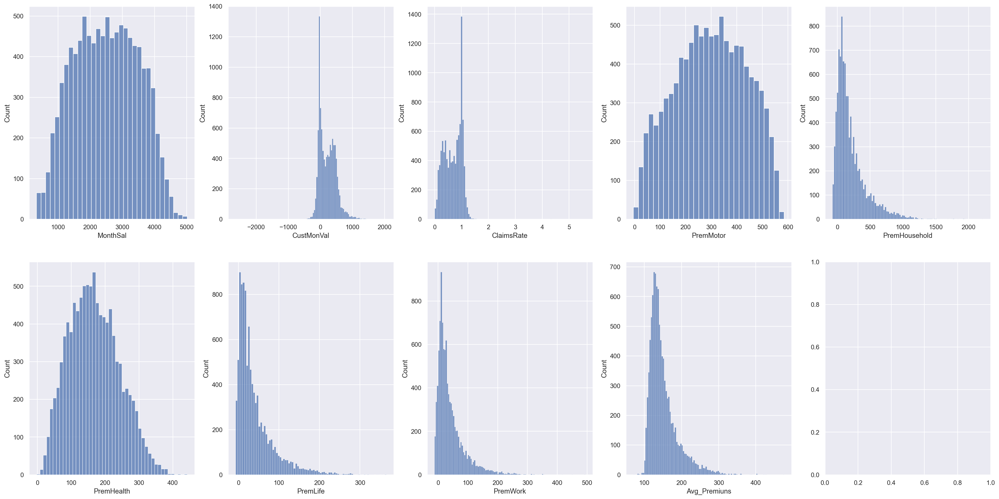

In [293]:
# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(30, 15))
# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
    sns.histplot(df_filter1[feat], ax=ax)
    #ax.set_title(feat, y=-0.15)
plt.show()

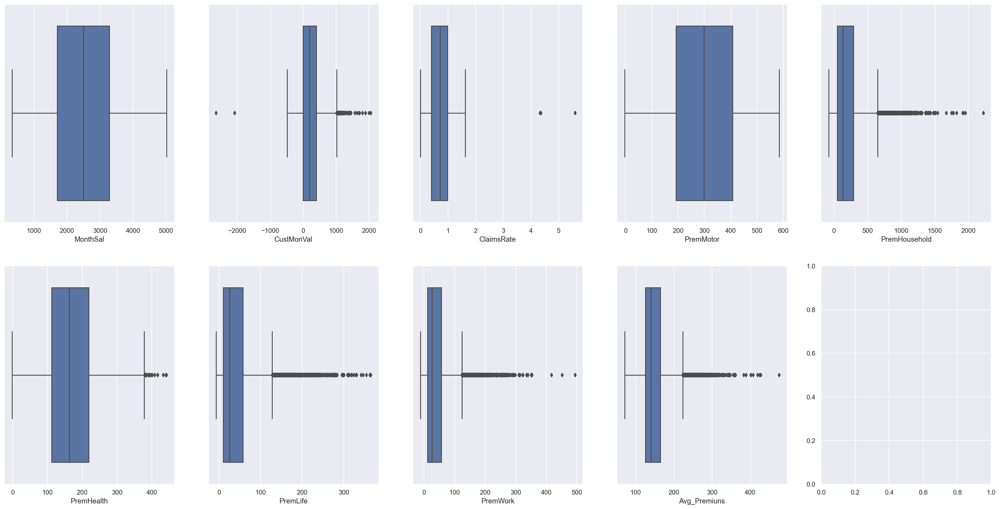

In [294]:
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(30, 15))
# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
    sns.boxplot(data=df_filter1, x=feat, ax=ax)
    #ax.set_title(feat, y=-0.15)
plt.show()

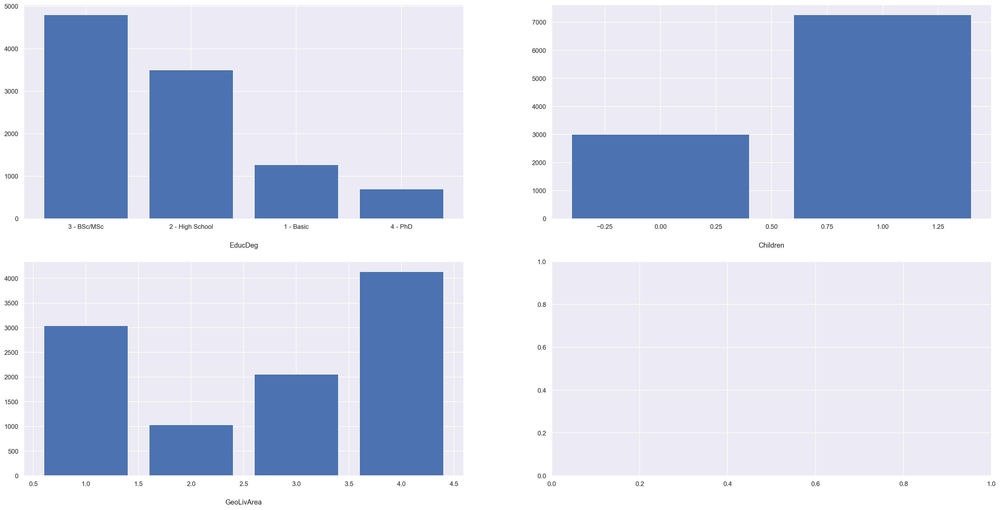

In [295]:
# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(2, ceil(len(non_metric_features) / 2), figsize=(30, 15))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), non_metric_features): # Notice the zip() function and flatten() method
    ax.bar(height=list(df_filter1[feat].value_counts()), x=list(df[feat].value_counts().index))
    ax.set_title(feat, y=-0.15)
plt.show()

In [27]:
# removing outliers using a threshold by observing the histogram and box plot
filters1 = (
    (df_filter1['MonthSal']<=5000)
    &
    (df_filter1['CustMonVal']<=1500)
    &
    (df_filter1['CustMonVal'] >= -1000)
    &
    (df_filter1['ClaimsRate']<=30)
    &
    (df_filter1['PremMotor']<=700)
    &
    (df_filter1['PremHousehold']<=1250)
    &
    (df_filter1['PremHealth']<=400)
    &
    (df_filter1['PremLife']<=270)
    &
    (df_filter1['PremWork']<=350)
        
)

df_filter = df_filter1[filters1]

In [28]:
print('Percentage of data kept after removing outliers:', np.round(df_filter.shape[0] / df.shape[0], 4)*100)

Percentage of data kept after removing outliers: 98.9


<hr>
<a class="anchor" id="removingoutliers3">
    
# 5.4. Removing Outliers with IQR
    
</a>

In [29]:
q25 = df.quantile(.25)
q75 = df.quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 1.5 * iqr
lower_lim = q25 - 1.5 * iqr

filters = []
for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters.append(df[metric].between(llim, ulim, inclusive=True))

df_iqr = df[np.all(filters, 0)]


In [30]:
print('Percentage of data kept after removing outliers:', np.round(df_iqr.shape[0] / df.shape[0], 4))

Percentage of data kept after removing outliers: 0.8537


<hr>
<a class="anchor" id="removingoutliers4">
    
# 5.5. Removing Outliers with Z-score
    
</a>

In [31]:
#calculation of the absolute z-score for every metric feature
z_score_abs = np.abs(stats.zscore(df[metric_features]))

In [32]:
z_score_abs

array([[0.28531945, 0.1043715 , 0.12094394, ..., 0.11252955, 0.47270946,
        0.21156972],
       [1.58360701, 0.15882197, 0.12932844, ..., 3.23253115, 1.26634871,
        0.30909152],
       [0.19876695, 0.16794703, 0.15865622, ..., 0.94484028, 1.12779309,
        0.05235856],
       ...,
       [0.3560346 , 0.17793307, 0.18265494, ..., 0.6139969 , 0.70655861,
        0.14647645],
       [0.46361761, 0.03708525, 0.03180583, ..., 0.46986885, 1.39847348,
        0.02045764],
       [0.26688552, 0.14691622, 0.16208461, ..., 0.73628353, 0.55065917,
        0.20308298]])

In [33]:
# we mantain only observations with a z-score inferior to 3.5
df_zscore = df[(z_score_abs < 3.5).all(axis = 1)]

In [34]:
df_zscore.shape

(10033, 12)

In [35]:
# we remove 2.55% of the observations 
print('Percentage of data kept after removing outliers:', np.round(df_zscore.shape[0] / df.shape[0], 4)*100)

Percentage of data kept after removing outliers: 97.45


<hr>
<a class="anchor" id="removingoutliers5">
    
# 5.6. Removing Outliers with LOF
    
</a>

In [36]:
# We use LocalOutlierFactor
local_outlier_factor = LocalOutlierFactor(n_neighbors=50) # is 200 neighbors to much????

In [37]:
lof_prediction = local_outlier_factor.fit_predict(df[metric_features])

In [38]:
df_lof = df[lof_prediction !=-1]

In [39]:
print('Percentage of data kept after removing outliers:', np.round(df_lof.shape[0] / df.shape[0], 4)*100)

Percentage of data kept after removing outliers: 99.0


<hr>
<a class="anchor" id="removingoutliers6">
    
# 5.7. Removing Outliers with OneClassSVM
    
</a>

In [40]:
one_class_svm = OneClassSVM(nu = 0.025)

In [41]:
svm_predict = one_class_svm.fit_predict(df[metric_features])

In [42]:
df_svm = df[svm_predict != -1]

In [43]:
print('Percentage of data kept after removing outliers:', np.round(df_svm.shape[0] / df.shape[0], 4)*100)

Percentage of data kept after removing outliers: 97.5


In [51]:
# dataset without outliers using LOF and Z-score 

In [52]:
df_filter_1 = df[(z_score_abs < 3.5).all(axis = 1)]

In [53]:
lof_prediction = local_outlier_factor.fit_predict(df_filter_1[metric_features])

In [54]:
df_filter_final = df_filter_1[lof_prediction !=-1]

In [55]:
print('Percentage of data kept after removing outliers:', np.round(df_filter_final.shape[0] / df.shape[0], 4)*100)

Percentage of data kept after removing outliers: 96.98


#### Creating the outliers data frame for posterior classification

In [56]:
df_outliers = pd.concat([df_filter_1[lof_prediction == -1], df[(z_score_abs >= 3.5)]])

In [104]:
df_outliers.drop_duplicates(inplace = True)

In [105]:
df_outliers.head(3)

,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns
CustID,,,,,,,,,,,,
146.0,b'1 - Basic',2554.0,1.0,True,-96.11,1.12,144.36,-11.10,381.85,47.23,12.78,115.024
288.0,b'2 - High School',2193.0,3.0,True,618.80,0.00,139.58,82.25,246.49,72.57,102.91,128.760
502.0,b'2 - High School',2483.0,1.0,True,625.68,0.00,160.03,73.35,129.69,116.91,170.70,130.136


<hr>
<a class="anchor" id="relandredun">
    
# 6. Relavancy and Redundancy 
    
</a>

<hr>
<a class="anchor" id="relbetvars">
    
# 6.1. Relation Between Variables 
    
</a>

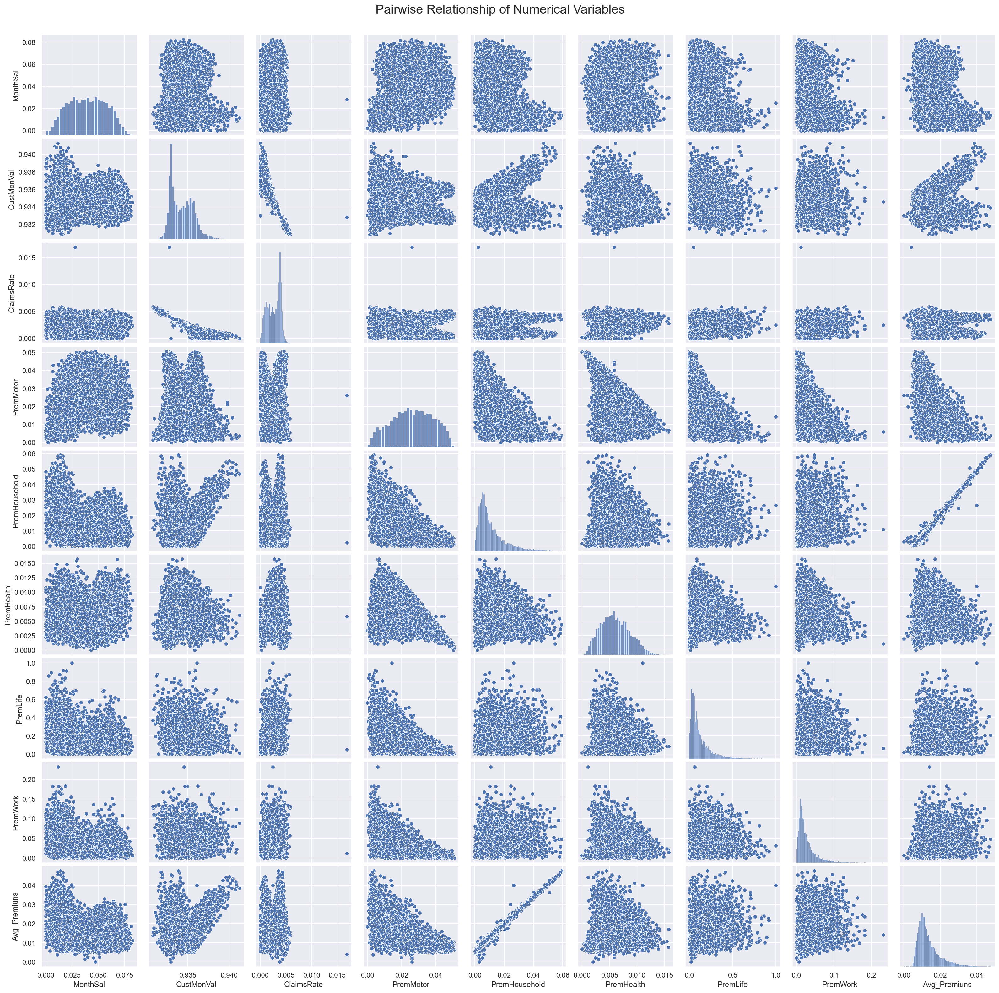

In [324]:
# Pairwise Relationship of Numerical Variables after the outlier removal
sns.set()

# Setting pairplot
sns.pairplot(df_filter_final[metric_features], diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

plt.show()

<hr>
<a class="anchor" id="correlation">
    
# 6.2. Correlation 
    
</a>

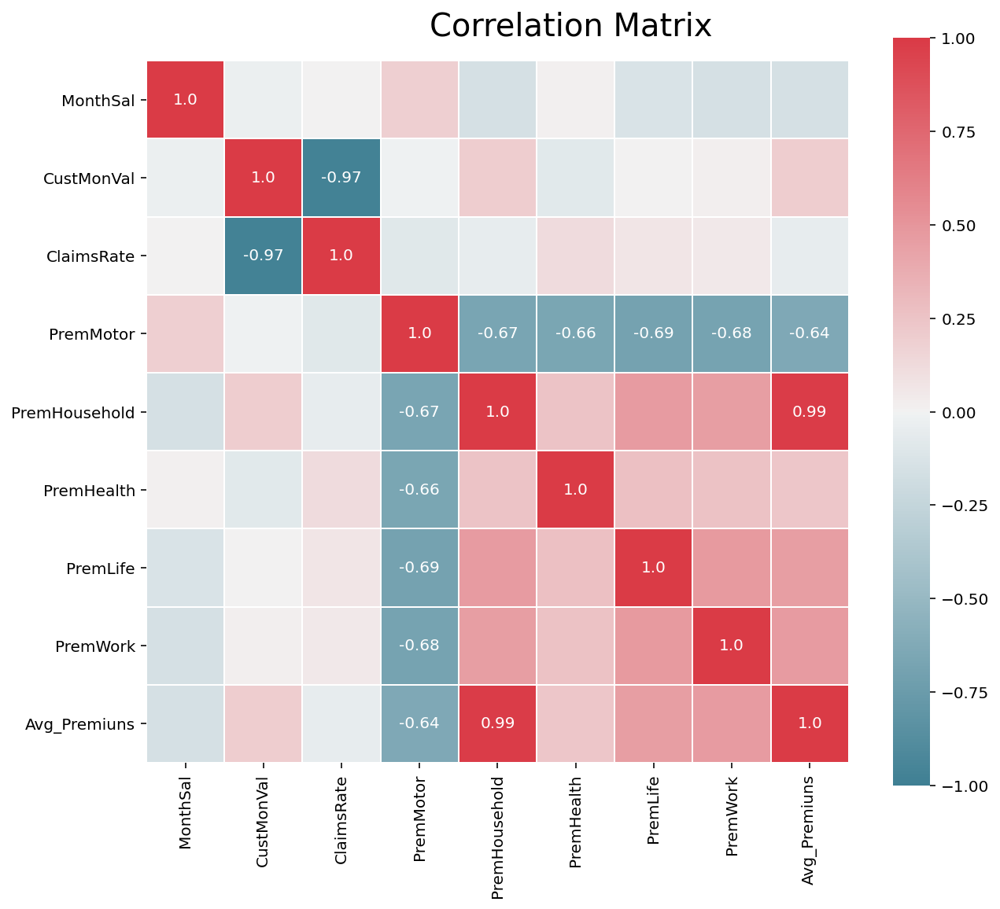

In [59]:
# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(df_filter[metric_features].corr(method="spearman"), decimals=2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)
# plt.savefig(os.path.join( 'figures', 'numeric_variables_correlation.png'), dpi=200)

plt.show()

In [60]:
df_filter_final.drop(columns = 'PremMotor', inplace = True)

C:\Users\tomas\anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [61]:
metric_features.remove('PremMotor')

In [62]:
df_filter_final.head(3)

,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns
CustID,,,,,,,,,,,
1.0,b'2 - High School',2177.0,1.0,True,380.97,0.39,79.45,146.36,47.01,16.89,133.112
2.0,b'2 - High School',677.0,4.0,True,-131.13,1.12,416.20,116.69,194.48,106.13,182.192
3.0,b'1 - Basic',2277.0,3.0,False,504.67,0.28,224.50,124.58,86.35,99.02,148.120


<hr>
<a class="anchor" id="normalization">
    
# 7. Normalization 
    
</a>

In [63]:
df_standard = df_filter_final.copy()

In [64]:
scaler = StandardScaler()
scaled_feat = scaler.fit_transform(df_standard[metric_features])

In [65]:
df_standard[metric_features] = scaled_feat
df_standard.head()

,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns
CustID,,,,,,,,,,,
1.0,b'2 - High School',-0.358561,1.0,True,0.660909,-0.908266,-0.537841,-0.308280,0.212777,-0.521891,-0.455585
2.0,b'2 - High School',-1.906806,4.0,True,-1.395634,1.386674,0.980249,-0.708852,3.871174,1.675681,0.905369
3.0,b'1 - Basic',-0.255344,3.0,False,1.157676,-1.254079,0.116054,-0.602330,1.188713,1.500594,-0.039424
4.0,b'3 - BSc/MSc',-1.471233,4.0,True,-0.937259,0.977986,-0.700582,1.916806,-0.076730,-0.239930,-0.815401
5.0,b'3 - BSc/MSc',-0.785876,4.0,True,-0.727549,0.695048,-0.680521,0.180858,-0.487546,0.082909,-0.657011


In [66]:
# Checking mean and variance of standardized variables
df_standard[metric_features].describe().round(2)

,MonthSal,CustMonVal,ClaimsRate,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns
count,9985.00,9985.00,9985.00,9985.00,9985.00,9985.00,9985.00,9985.00
mean,0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-2.26,-2.34,-2.13,-1.23,-2.31,-1.13,-1.23,-2.18
25%,-0.79,-0.90,-0.91,-0.68,-0.76,-0.71,-0.69,-0.67
50%,0.00,-0.12,0.13,-0.31,-0.07,-0.32,-0.31,-0.29
75%,0.80,0.73,0.95,0.37,0.69,0.39,0.37,0.39
max,2.46,4.98,11.48,5.59,3.69,4.16,4.46,5.49


In [67]:
df_final = df_standard.copy()

<hr>
<a class="anchor" id="ohc">
    
# 8. One Hot Encodindg 
    
</a>

In [68]:
df_ohc = df_final.copy()

In [69]:
# Use OneHotEncoder to encode the categorical features. Get feature names and create a DataFrame 
# with the one-hot encoded categorical features (pass feature names)
ohc = OneHotEncoder(sparse=False, drop = 'first')
ohc_feat = ohc.fit_transform(df_ohc[non_metric_features])
ohc_feat_names = ohc.get_feature_names()
ohc_df = pd.DataFrame(ohc_feat, index=df_ohc.index, columns=ohc_feat_names)  # Why the index=df_ohc.index?
ohc_df.head(15)

,x0_b'2 - High School',x0_b'3 - BSc/MSc',x0_b'4 - PhD',x1_True,x2_2.0,x2_3.0,x2_4.0
CustID,,,,,,,
1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
2.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
3.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
5.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
6.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
7.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
8.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
9.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0


In [70]:
# Reassigning df to contain ohc variables
df_ohc = pd.concat([df_ohc.drop(columns=non_metric_features), ohc_df], axis=1)
df_ohc.head()

,MonthSal,CustMonVal,ClaimsRate,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,x0_b'2 - High School',x0_b'3 - BSc/MSc',x0_b'4 - PhD',x1_True,x2_2.0,x2_3.0,x2_4.0
CustID,,,,,,,,,,,,,,,
1.0,-0.358561,0.660909,-0.908266,-0.537841,-0.308280,0.212777,-0.521891,-0.455585,1.0,0.0,0.0,1.0,0.0,0.0,0.0
2.0,-1.906806,-1.395634,1.386674,0.980249,-0.708852,3.871174,1.675681,0.905369,1.0,0.0,0.0,1.0,0.0,0.0,1.0
3.0,-0.255344,1.157676,-1.254079,0.116054,-0.602330,1.188713,1.500594,-0.039424,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4.0,-1.471233,-0.937259,0.977986,-0.700582,1.916806,-0.076730,-0.239930,-0.815401,0.0,1.0,0.0,1.0,0.0,0.0,1.0
5.0,-0.785876,-0.727549,0.695048,-0.680521,0.180858,-0.487546,0.082909,-0.657011,0.0,1.0,0.0,1.0,0.0,0.0,1.0


In [71]:
df_final = df_ohc.copy()

<hr>
<a class="anchor" id="pca">
    
# 9. PCA 
    
</a>

In [72]:
df_pca = df_final.copy()

In [73]:
# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(df_pca[metric_features])

In [74]:
# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,2.878229,0.000000,0.359743,0.359743
2,1.958583,-0.919646,0.244798,0.604541
3,0.980115,-0.978467,0.122502,0.727043
4,0.856033,-0.124082,0.106993,0.834036
5,0.708474,-0.147559,0.088550,0.922587
6,0.571373,-0.137102,0.071414,0.994001
7,0.043334,-0.528039,0.005416,0.999418
8,0.004660,-0.038675,0.000582,1.000000


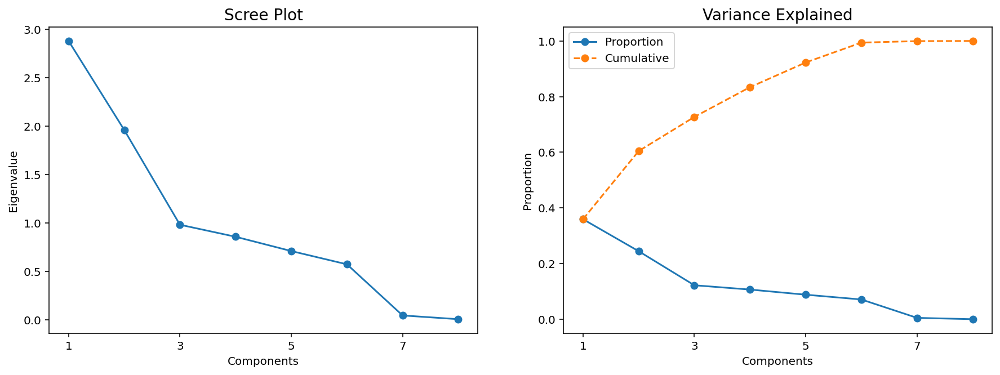

In [75]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))
# plt.savefig(os.path.join( 'figures', 'screeplot.png'), dpi=200)
plt.show()

In [76]:
# Perform PCA again with the number of principal components you want to retain
pca = PCA(n_components=4) # 5 may be better???????
pca_feat = pca.fit_transform(df_pca[metric_features])
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_pca.index, columns=pca_feat_names)  # remember index=df_pca.index
pca_df

,PC0,PC1,PC2,PC3
CustID,,,,
1.0,-0.368796,-1.180959,-0.347477,-0.523176
2.0,2.989815,2.856480,-2.130462,-0.265944
3.0,1.449356,-1.227826,-0.413774,-0.432410
4.0,-0.715121,1.694129,0.025595,-2.195616
5.0,-0.924623,0.890511,-0.634268,-0.745061
...,...,...,...,...
10291.0,5.788445,1.618463,-1.905994,0.683652
10292.0,-1.604522,0.853461,0.315249,0.387845
10294.0,-0.563107,-2.183951,0.310933,0.035483


In [77]:
# Reassigning df to contain pca variables
df_pca = pd.concat([df_pca, pca_df], axis=1)
df_pca.head()

,MonthSal,CustMonVal,ClaimsRate,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,x0_b'2 - High School',x0_b'3 - BSc/MSc',x0_b'4 - PhD',x1_True,x2_2.0,x2_3.0,x2_4.0,PC0,PC1,PC2,PC3
CustID,,,,,,,,,,,,,,,,,,,
1.0,-0.358561,0.660909,-0.908266,-0.537841,-0.308280,0.212777,-0.521891,-0.455585,1.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.368796,-1.180959,-0.347477,-0.523176
2.0,-1.906806,-1.395634,1.386674,0.980249,-0.708852,3.871174,1.675681,0.905369,1.0,0.0,0.0,1.0,0.0,0.0,1.0,2.989815,2.856480,-2.130462,-0.265944
3.0,-0.255344,1.157676,-1.254079,0.116054,-0.602330,1.188713,1.500594,-0.039424,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.449356,-1.227826,-0.413774,-0.432410
4.0,-1.471233,-0.937259,0.977986,-0.700582,1.916806,-0.076730,-0.239930,-0.815401,0.0,1.0,0.0,1.0,0.0,0.0,1.0,-0.715121,1.694129,0.025595,-2.195616
5.0,-0.785876,-0.727549,0.695048,-0.680521,0.180858,-0.487546,0.082909,-0.657011,0.0,1.0,0.0,1.0,0.0,0.0,1.0,-0.924623,0.890511,-0.634268,-0.745061


In [78]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_pca[metric_features + pca_feat_names].corr().loc[metric_features, pca_feat_names]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3
MonthSal,-0.366947,-0.066716,0.698087,0.550981
CustMonVal,0.398422,-0.892203,0.109745,-0.101389
ClaimsRate,-0.169946,0.948581,-0.089430,0.178150
PremHousehold,0.916560,0.049978,0.047876,0.283615
PremHealth,0.198982,0.345425,0.683131,-0.571701
PremLife,0.642222,0.271511,-0.015537,-0.081249
PremWork,0.650998,0.245617,-0.029442,-0.125321
Avg_Premiuns,0.916376,0.047352,0.050820,0.284189


In [79]:
df_final = df_pca.copy()

In [80]:
df_final.head()

,MonthSal,CustMonVal,ClaimsRate,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,x0_b'2 - High School',x0_b'3 - BSc/MSc',x0_b'4 - PhD',x1_True,x2_2.0,x2_3.0,x2_4.0,PC0,PC1,PC2,PC3
CustID,,,,,,,,,,,,,,,,,,,
1.0,-0.358561,0.660909,-0.908266,-0.537841,-0.308280,0.212777,-0.521891,-0.455585,1.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.368796,-1.180959,-0.347477,-0.523176
2.0,-1.906806,-1.395634,1.386674,0.980249,-0.708852,3.871174,1.675681,0.905369,1.0,0.0,0.0,1.0,0.0,0.0,1.0,2.989815,2.856480,-2.130462,-0.265944
3.0,-0.255344,1.157676,-1.254079,0.116054,-0.602330,1.188713,1.500594,-0.039424,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.449356,-1.227826,-0.413774,-0.432410
4.0,-1.471233,-0.937259,0.977986,-0.700582,1.916806,-0.076730,-0.239930,-0.815401,0.0,1.0,0.0,1.0,0.0,0.0,1.0,-0.715121,1.694129,0.025595,-2.195616
5.0,-0.785876,-0.727549,0.695048,-0.680521,0.180858,-0.487546,0.082909,-0.657011,0.0,1.0,0.0,1.0,0.0,0.0,1.0,-0.924623,0.890511,-0.634268,-0.745061


<hr>
<a class="anchor" id="clustering">
    
# 10. Clustering 
    
</a>

<hr>
<a class="anchor" id="allfeatures">
    
# 10.1. Clustering - All features 
    
</a>

In [81]:
# Splitting feature names into groups
non_metric_features = df_final.columns[df_final.columns.str.startswith('x')]
pc_features = df_final.columns[df_final.columns.str.startswith('PC')]
metric_features = df_final.columns[~df_final.columns.str.startswith('x') & ~df_final.columns.str.startswith('PC')]

#### In this stage we created clusters using all metric features and using k-means 

In [82]:
df = df_final.copy()

In [83]:
# reseting the index of the df 
# we did this so that when concatenate the k-means labels and the df there where no missing values
df.reset_index( inplace = True)
df.drop(columns = 'CustID', inplace = True)

#### Defining the number of clusters

In [84]:
range_clusters = range(1, 15)

In [85]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df[metric_features])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

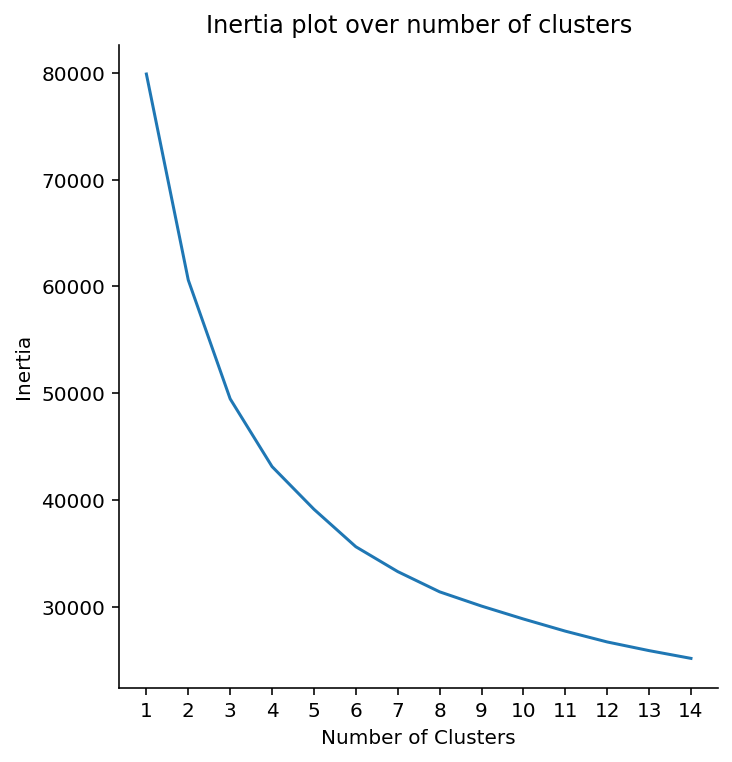

In [86]:
sns.relplot(x = range_clusters, 
            y = inertia,
            kind = 'line')
plt.xticks(range_clusters)
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Inertia plot over number of clusters')
plt.show()

For n_clusters = 2, the average silhouette_score is : 0.3162510502500495
For n_clusters = 3, the average silhouette_score is : 0.22618036969530822
For n_clusters = 4, the average silhouette_score is : 0.22856766141936535
For n_clusters = 5, the average silhouette_score is : 0.23863402215701426
For n_clusters = 6, the average silhouette_score is : 0.24928162633881898
For n_clusters = 7, the average silhouette_score is : 0.25110558279813455
For n_clusters = 8, the average silhouette_score is : 0.24422608068793195
For n_clusters = 9, the average silhouette_score is : 0.22988096419860346
For n_clusters = 10, the average silhouette_score is : 0.22531942639410538
For n_clusters = 11, the average silhouette_score is : 0.21903426980188545
For n_clusters = 12, the average silhouette_score is : 0.22121050594716332
For n_clusters = 13, the average silhouette_score is : 0.19414131069657936
For n_clusters = 14, the average silhouette_score is : 0.1869366171799288


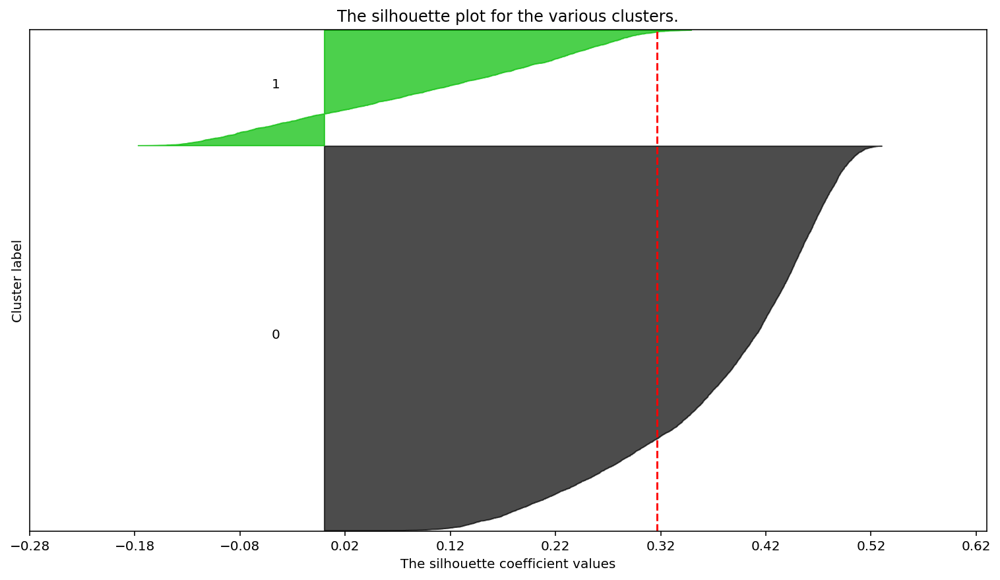

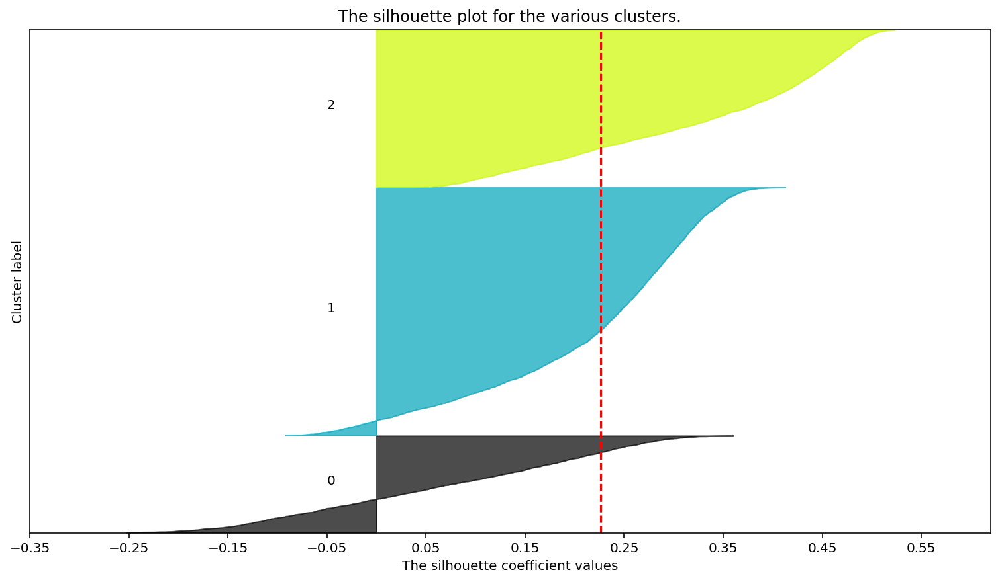

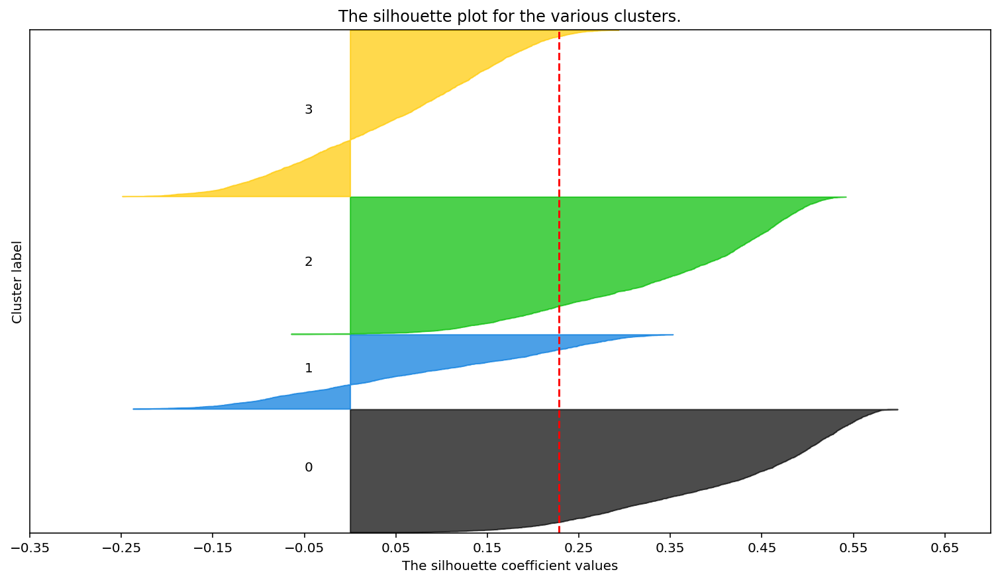

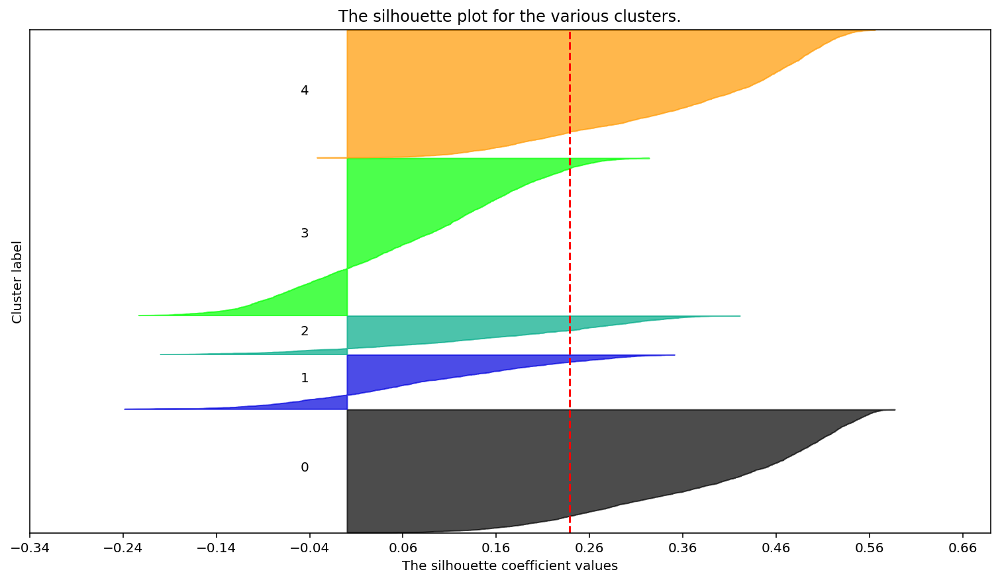

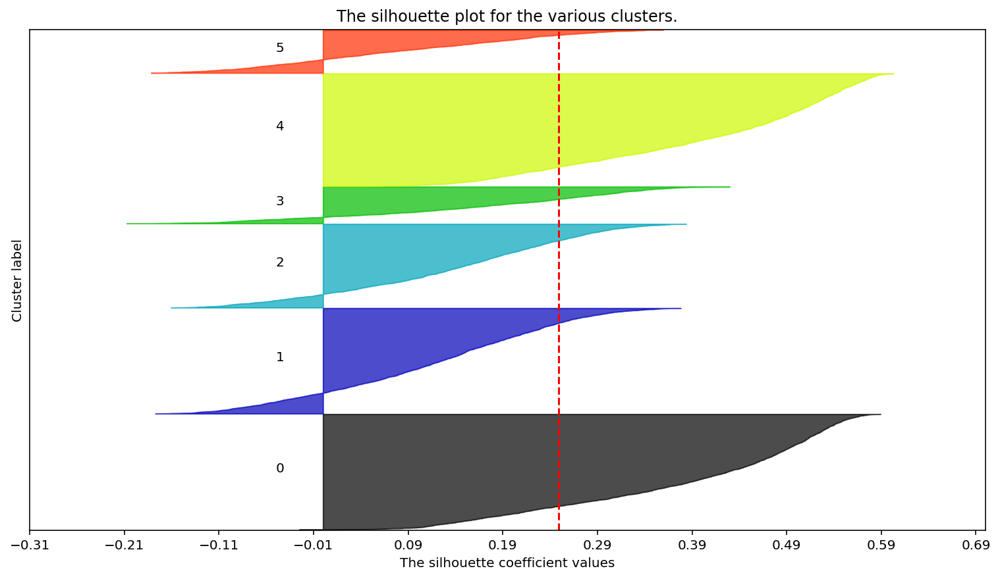

...

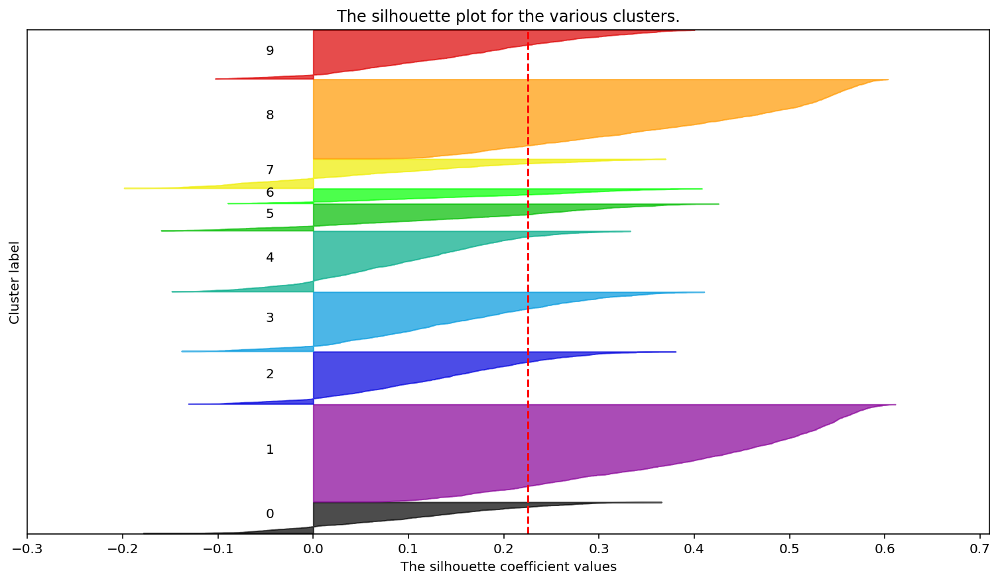

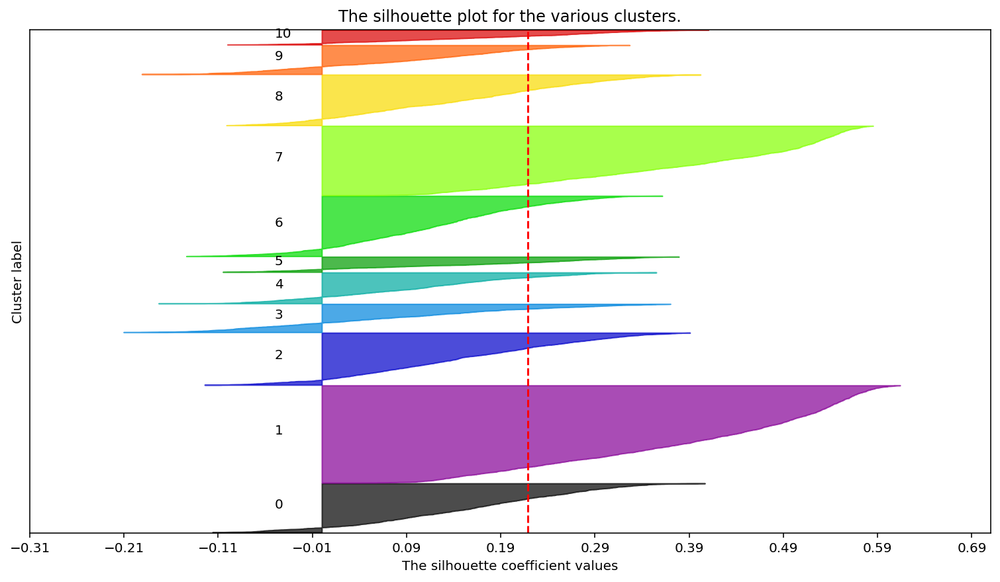

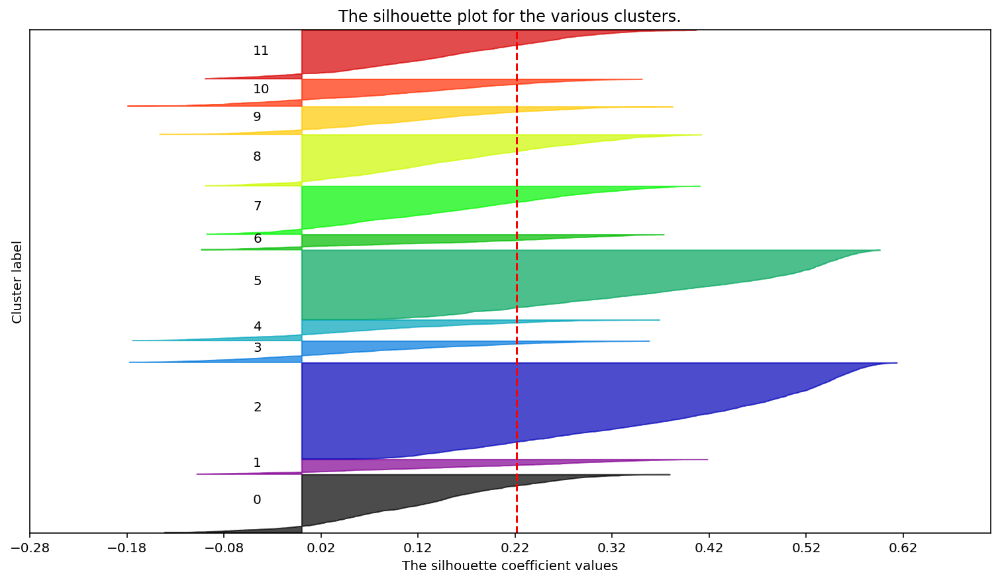

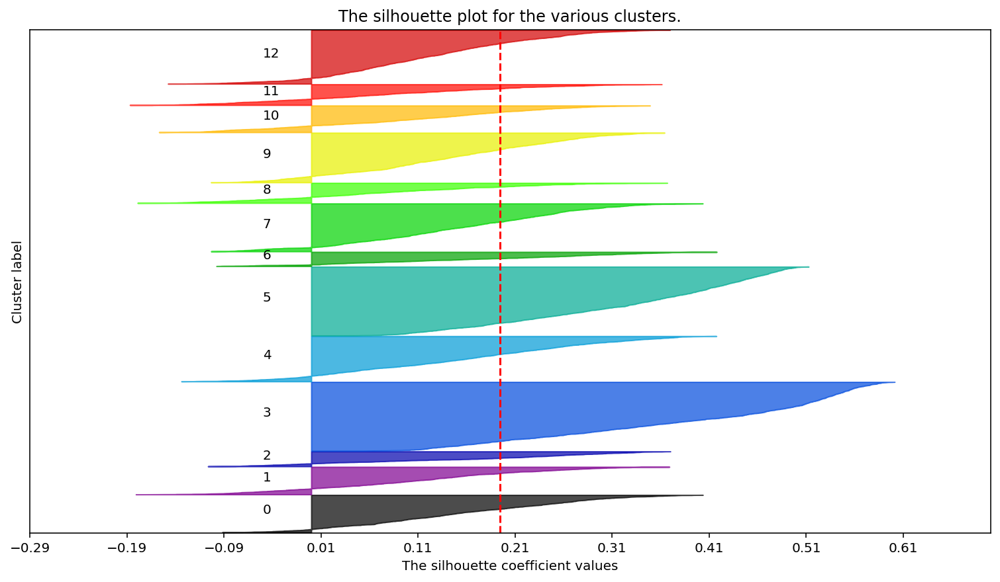

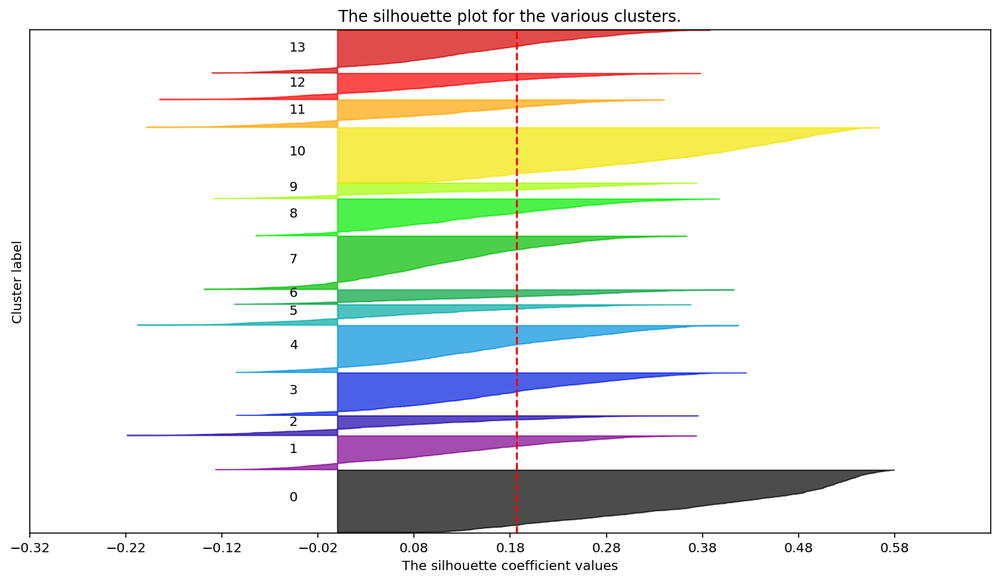

In [87]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df[metric_features])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df[metric_features], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df[metric_features], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df[metric_features]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

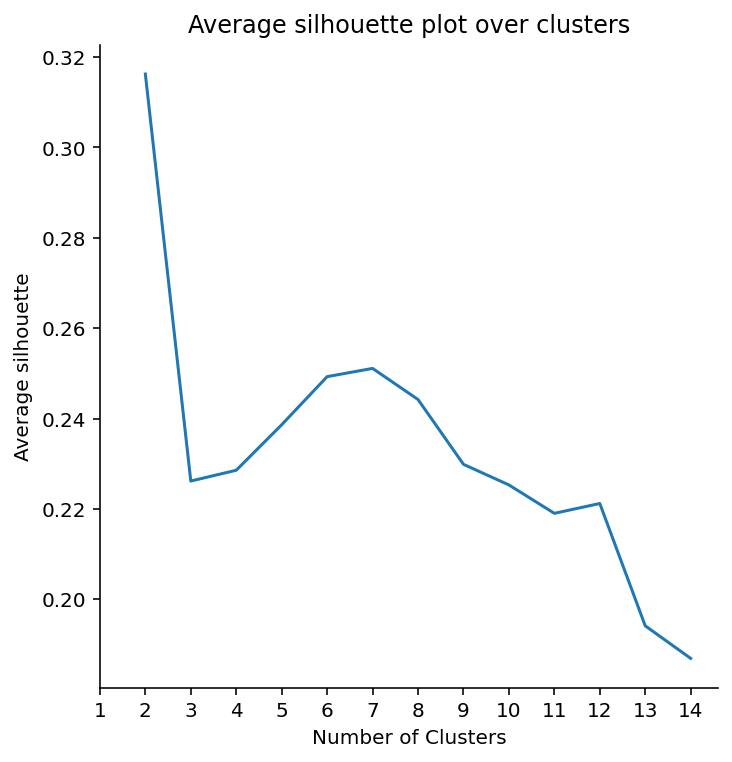

In [88]:
sns.relplot(x = range_clusters[1:], 
            y = avg_silhouette,
            kind = 'line')
plt.xticks(range_clusters)
plt.xlabel('Number of Clusters')
plt.ylabel('Average silhouette')
plt.title('Average silhouette plot over clusters')
plt.show()

In [89]:
# number of clusters = 4
number_clusters = 4
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(df[metric_features])
km_labels

array([2, 1, 2, ..., 2, 3, 2])

In [90]:
# Characterizing the final clusters
df_kmeans_all = pd.concat((df, pd.Series(km_labels, name='labels')), axis=1)
df_kmeans_all.groupby('labels').mean()

,MonthSal,CustMonVal,ClaimsRate,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,x0_b'2 - High School',x0_b'3 - BSc/MSc',x0_b'4 - PhD',x1_True,x2_2.0,x2_3.0,x2_4.0,PC0,PC1,PC2,PC3
labels,,,,,,,,,,,,,,,,,,,
0,0.110429,-0.911229,0.955956,-0.584726,-0.632829,-0.557527,-0.552743,-0.584098,0.255605,0.592744,0.111700,0.823889,0.113738,0.202201,0.397880,-1.462489,0.821639,-0.579269,0.505919
1,-0.714309,0.708791,-0.221498,1.835573,-0.043722,1.154826,1.179457,1.818388,0.470310,0.176788,0.002699,0.674764,0.102564,0.195682,0.400810,3.201789,-0.020620,-0.306376,0.341368
2,0.102681,0.857008,-1.164813,-0.447458,-0.494502,-0.473591,-0.464085,-0.442358,0.256673,0.588300,0.108592,0.797806,0.094333,0.200366,0.396709,-0.600328,-1.667179,-0.091710,-0.120086
3,0.152908,-0.349653,0.352659,-0.018760,0.895803,0.287009,0.264614,-0.015749,0.417798,0.440724,0.036501,0.566817,0.098039,0.199698,0.411161,0.146104,0.776716,0.641274,-0.427901


In [91]:
# number of observations in each cluster
df_kmeans_all['labels'].value_counts()

3    3315
2    2735
0    2453
1    1482
Name: labels, dtype: int64

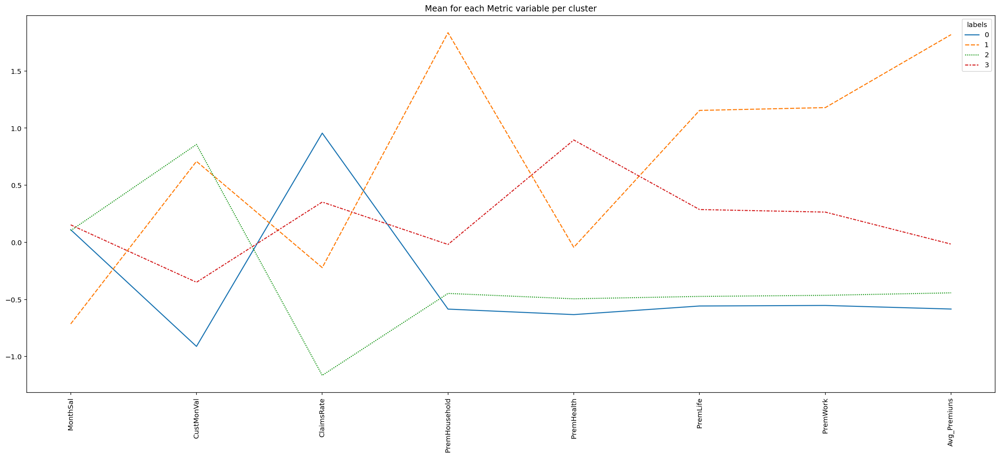

In [94]:
plt.figure(figsize = (25,10))
sns.lineplot(data = df_kmeans_all.groupby('labels').mean()[metric_features].T)
plt.xticks(rotation = 90)
plt.title('Mean for each Metric variable per cluster')
# plt.savefig(os.path.join( 'figures', 'mean-clusters.png'), dpi=200)
plt.show()

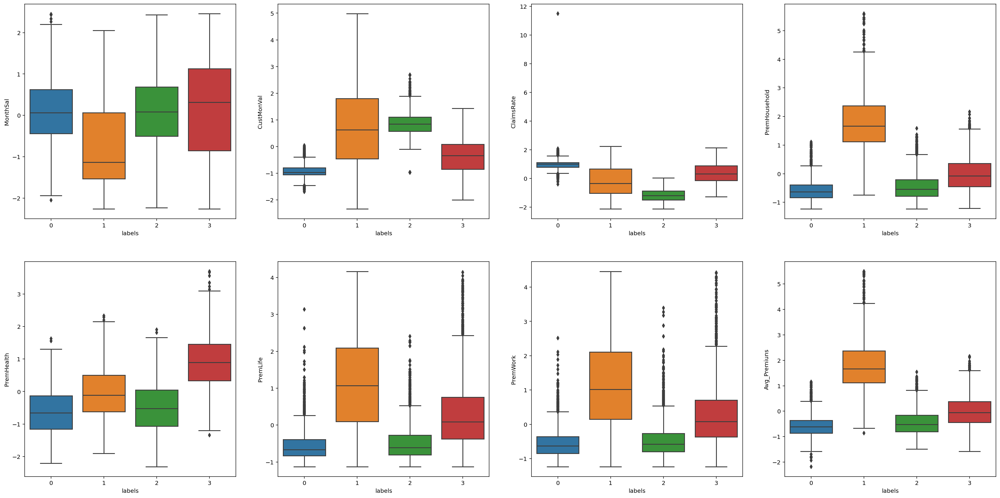

In [93]:
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(30, 15))
# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
    sns.boxplot(data=df_kmeans_all, x=df_kmeans_all.labels, y = feat, ax=ax)
    #ax.set_title(feat, y=-0.15)
plt.show()

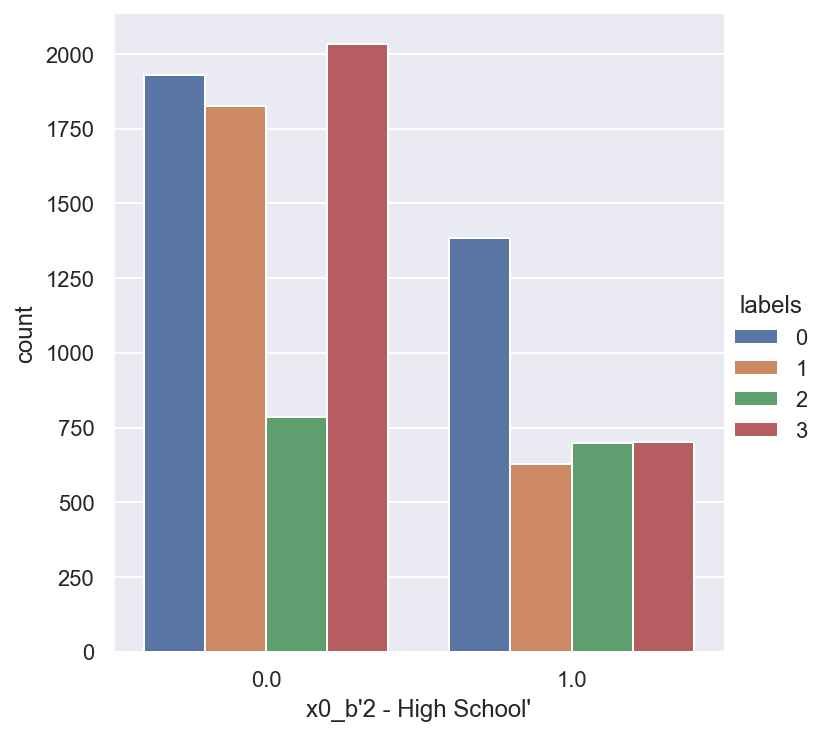

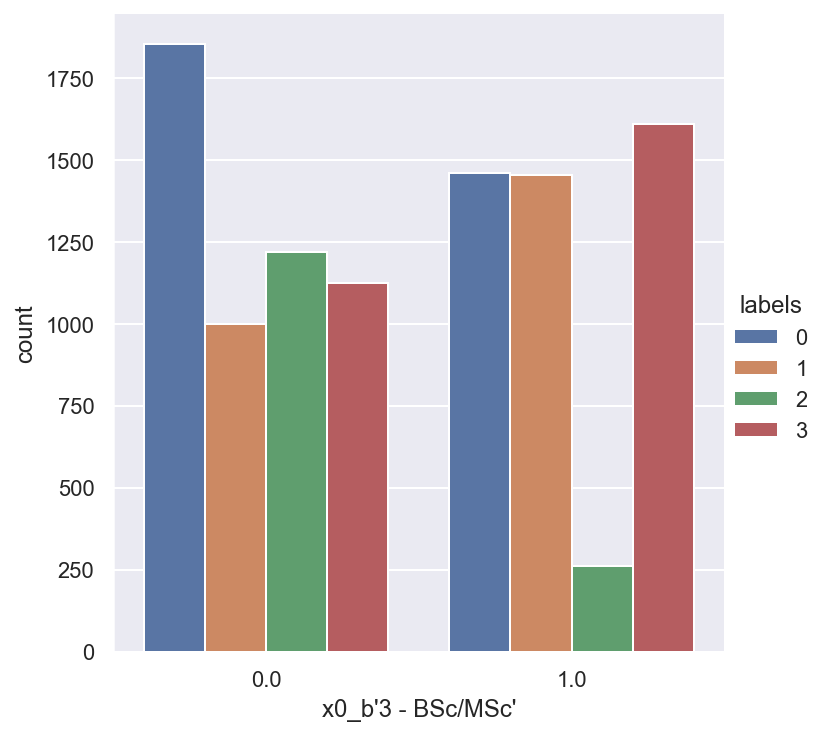

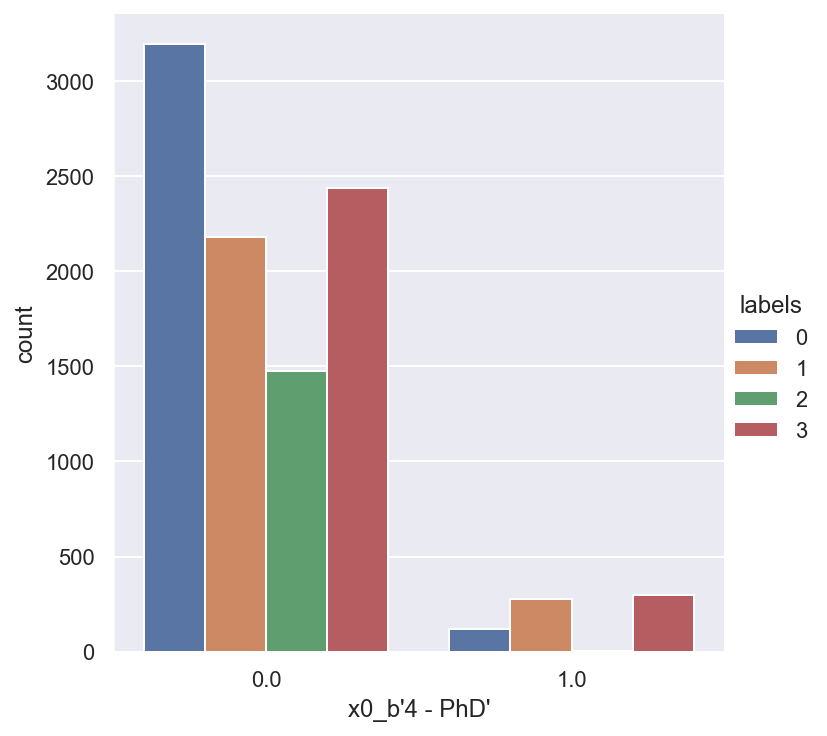

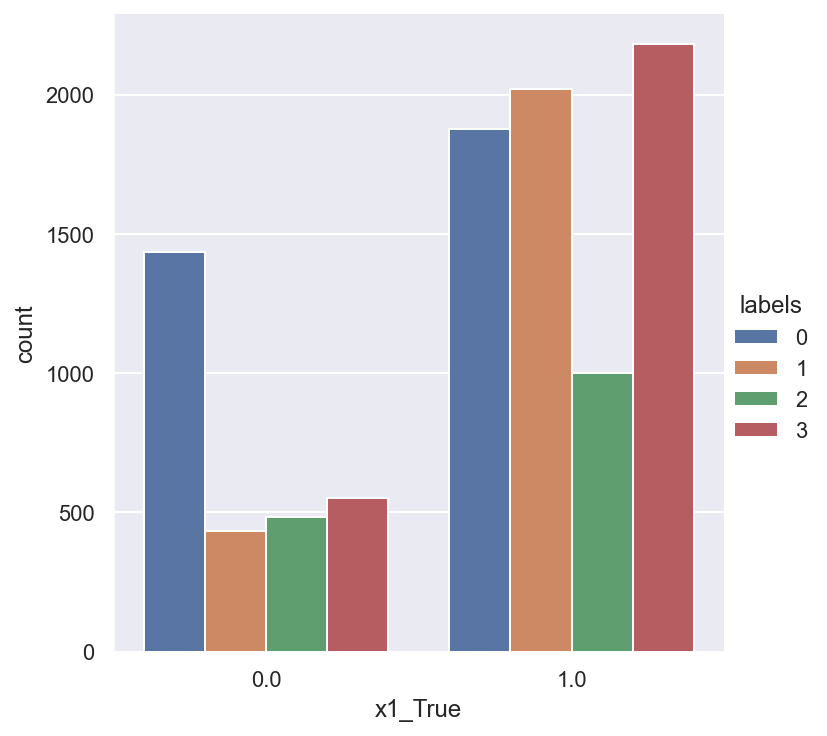

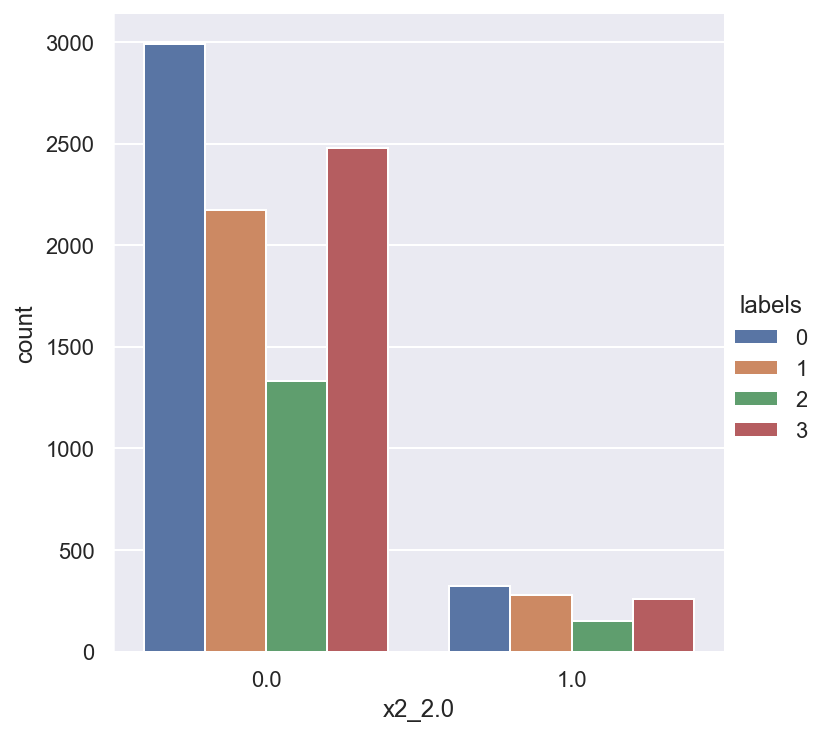

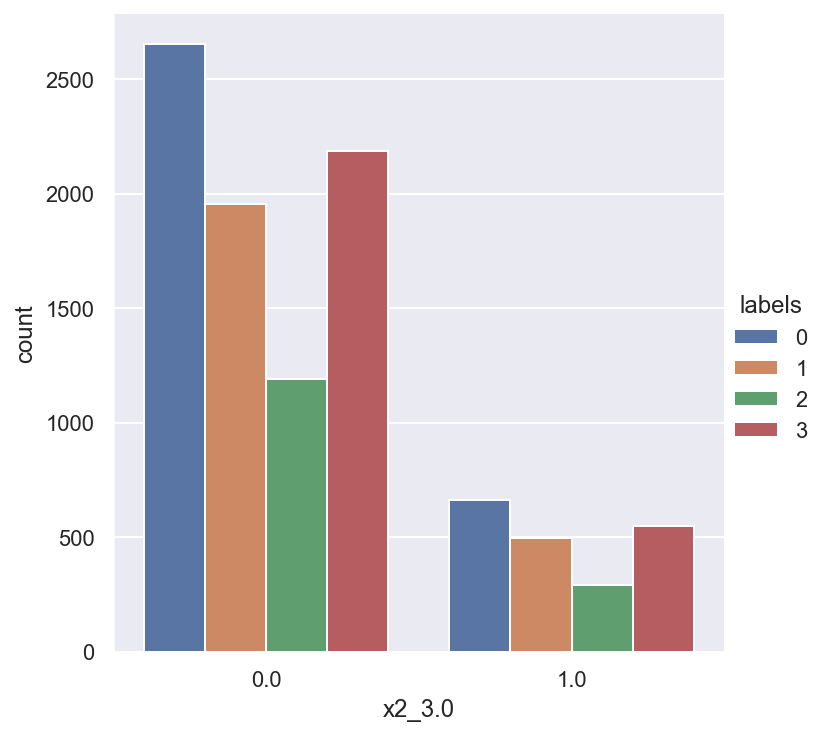

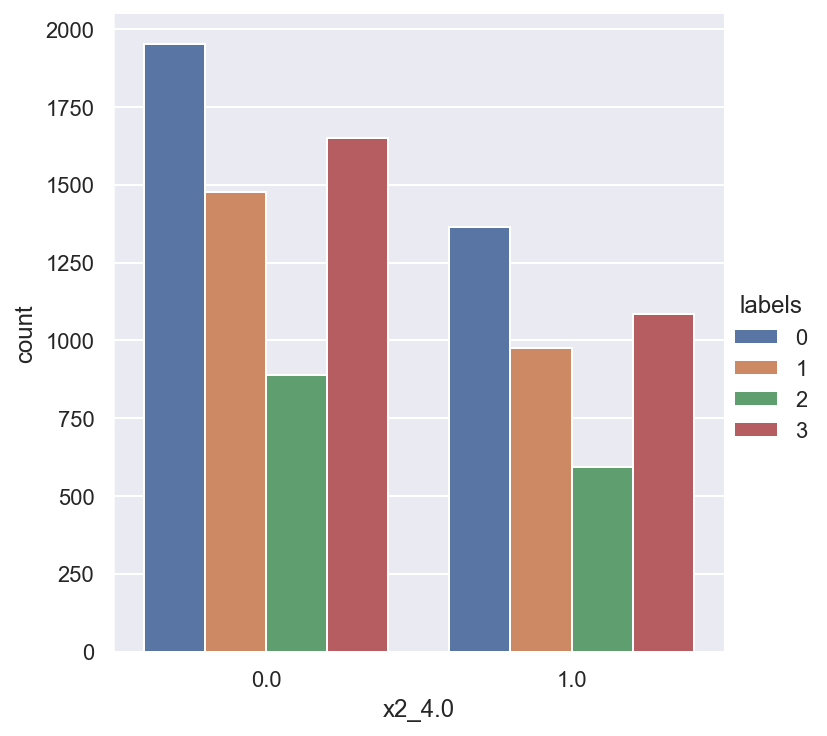

In [333]:
# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), non_metric_features): # Notice the zip() function and flatten() method
    sns.catplot(data = df_kmeans_all, x= feat,  kind = 'count', hue = 'labels')
    ax.set_title(feat, y=-0.15)
plt.show()

In [334]:
# number of clusters = 3
number_clusters = 3
kmclust2 = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels2 = kmclust2.fit_predict(df[metric_features])
km_labels2

array([2, 0, 2, ..., 2, 0, 2])

In [335]:
# Characterizing the final clusters
df_kmeans_all2 = pd.concat((df, pd.Series(km_labels2, name='labels')), axis=1)
df_kmeans_all2.groupby('labels').mean()

,MonthSal,CustMonVal,ClaimsRate,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,x0_b'2 - High School',x0_b'3 - BSc/MSc',x0_b'4 - PhD',x1_True,x2_2.0,x2_3.0,x2_4.0,PC0,PC1,PC2,PC3
labels,,,,,,,,,,,,,,,,,,,
0,-0.619596,0.519964,-0.124682,1.547627,0.115859,1.112839,1.125409,1.536400,0.482579,0.199168,0.003120,0.664067,0.102444,0.196568,0.400416,2.801445,0.162809,-0.185283,0.174616
1,0.168506,-0.715736,0.737003,-0.350036,0.162590,-0.175321,-0.183989,-0.348550,0.331104,0.525633,0.076393,0.687741,0.106180,0.200608,0.406282,-0.773674,0.897383,0.058500,0.046184
2,0.115097,0.809807,-1.086456,-0.399316,-0.327847,-0.407669,-0.401719,-0.394756,0.271506,0.578510,0.100096,0.771027,0.093700,0.200831,0.397506,-0.501790,-1.516362,0.021618,-0.180270


In [336]:
# number of observations in each cluster
df_kmeans_all2['labels'].value_counts()

1    4935
2    3127
0    1923
Name: labels, dtype: int64

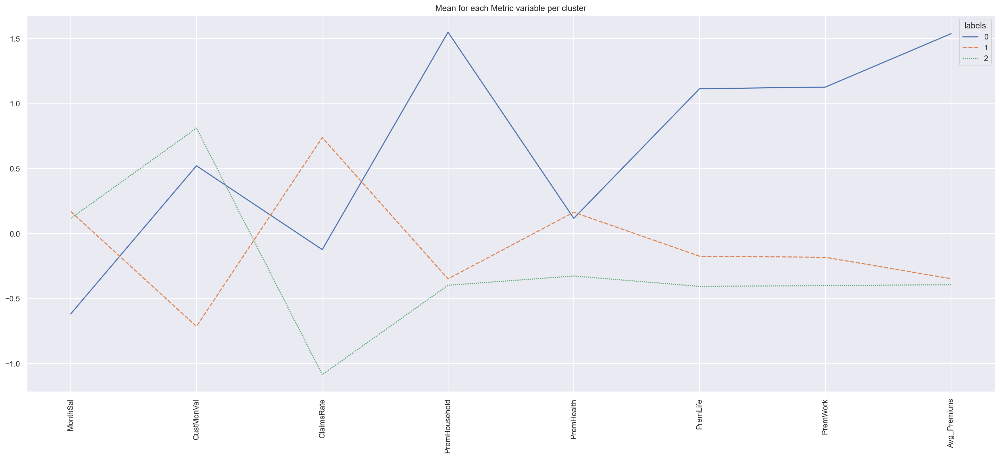

In [337]:
plt.figure(figsize = (25,10))
sns.lineplot(data = df_kmeans_all2.groupby('labels').mean()[metric_features].T)
plt.xticks(rotation = 90)
plt.title('Mean for each Metric variable per cluster')
plt.show()

<hr>
<a class="anchor" id="kmeanspca">
    
# 10.2. K-Means - PCA 
    
</a>

In [338]:
range_clusters = range(1, 15)

In [339]:
inertia_pca = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust_pca = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust_pca.fit(df[pc_features])
    inertia_pca.append(kmclust_pca.inertia_)  # save the inertia of the given cluster solution

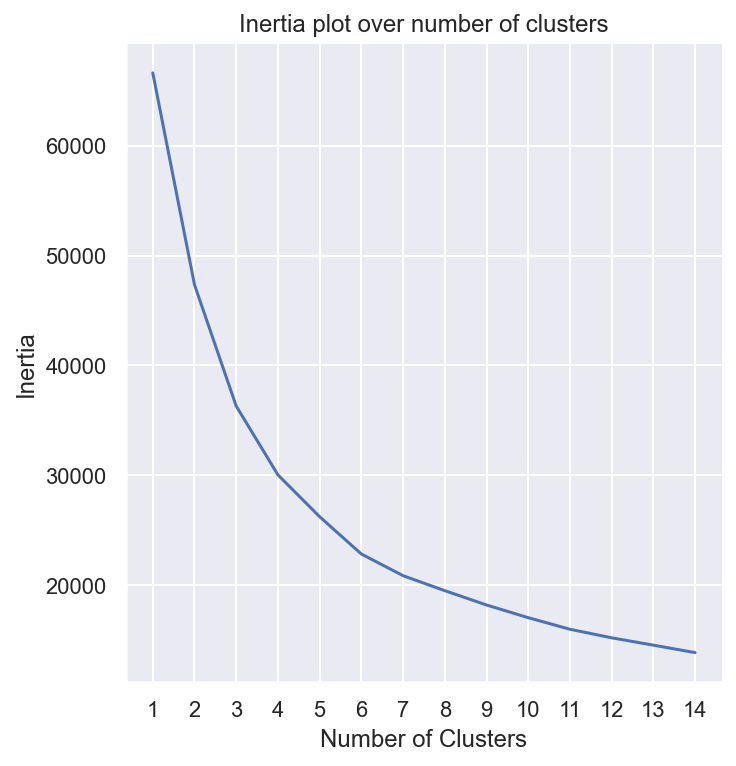

In [340]:
sns.relplot(x = range_clusters, 
            y = inertia_pca,
            kind = 'line')
plt.xticks(range_clusters)
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Inertia plot over number of clusters')
plt.show()

In [341]:
# number of clusters = 4
number_clusters = 4
kmclust_pca = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels_pca = kmclust_pca.fit_predict(df[pc_features])
km_labels_pca

array([3, 2, 3, ..., 3, 0, 3])

In [342]:
# Characterizing the final clusters
df_kmeans_pca = pd.concat((df, pd.Series(km_labels_pca, name='labels')), axis=1)
df_kmeans_pca.groupby('labels').mean()

,MonthSal,CustMonVal,ClaimsRate,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,x0_b'2 - High School',x0_b'3 - BSc/MSc',x0_b'4 - PhD',x1_True,x2_2.0,x2_3.0,x2_4.0,PC0,PC1,PC2,PC3
labels,,,,,,,,,,,,,,,,,,,
0,0.147161,-0.348851,0.351491,-0.013798,0.914579,0.265349,0.247349,-0.010476,0.418668,0.440559,0.037397,0.565217,0.097902,0.199149,0.411675,0.140559,0.773445,0.651736,-0.435856
1,0.122407,-0.909441,0.953798,-0.587143,-0.640478,-0.533865,-0.533234,-0.586720,0.257282,0.592638,0.110032,0.822816,0.114078,0.201052,0.396845,-1.451619,0.824417,-0.576910,0.510900
2,-0.711891,0.705336,-0.223559,1.815057,-0.047139,1.170915,1.191360,1.797876,0.465552,0.179264,0.002676,0.674247,0.101672,0.197324,0.402007,3.188754,-0.016989,-0.309878,0.329286
3,0.101749,0.857835,-1.165123,-0.445846,-0.496268,-0.477661,-0.467739,-0.440820,0.257237,0.587761,0.108831,0.799194,0.094540,0.201173,0.396482,-0.601350,-1.669630,-0.093137,-0.117881


In [343]:
# number of observations in each cluster
df_kmeans_pca['labels'].value_counts()

0    3289
3    2729
1    2472
2    1495
Name: labels, dtype: int64

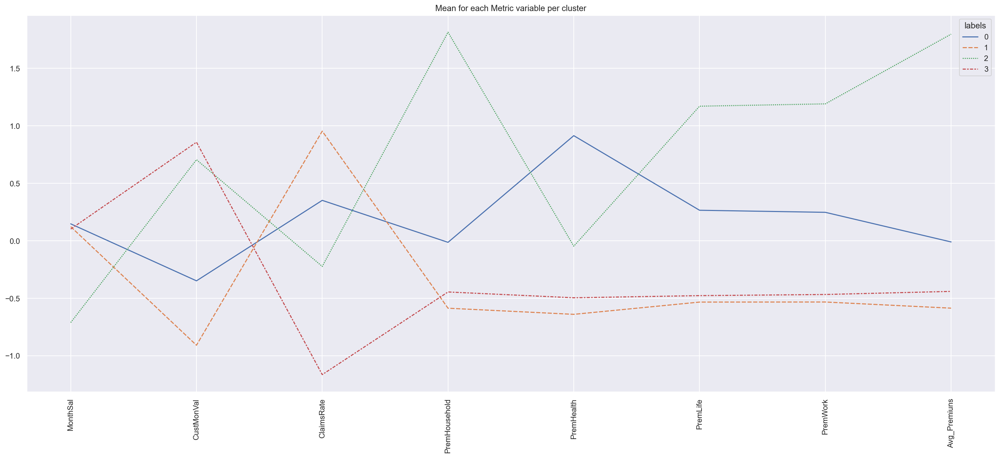

In [344]:
plt.figure(figsize = (25,10))
sns.lineplot(data = df_kmeans_pca.groupby('labels').mean()[metric_features].T)
plt.xticks(rotation = 90)
plt.title('Mean for each Metric variable per cluster')
plt.show()

<hr>
<a class="anchor" id="kmeans">
    
# 10.3. K-Means - Different Perspectives 
    
</a>

In [345]:
# Split variables into perspectives 
#Costumer Value
costumer_value = ['MonthSal',
                  'CustMonVal',
                  'ClaimsRate'
]
# Costumer spent on insurance
costumer_spent = [
    'PremHousehold', 
    'PremHealth',
    'PremLife', 
    'PremWork',
    'Avg_Premiuns'
]

df_value = df[costumer_value].copy()
df_spent = df[costumer_spent].copy()

In [346]:
# calculating inertia for each perspective to find the number of clusters
def get_inertia(df, range_clusters):
    inertia = []
    for n_clus in range_clusters:  # iterate over desired ncluster range
        kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
        kmclust.fit(df)
        inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution
    return inertia

In [347]:
inertia = {}
inertia['value'] = get_inertia(df_value, range(1, 10))
inertia['spent'] = get_inertia(df_spent, range(1, 10))

In [348]:
df_inertia = pd.DataFrame(inertia)


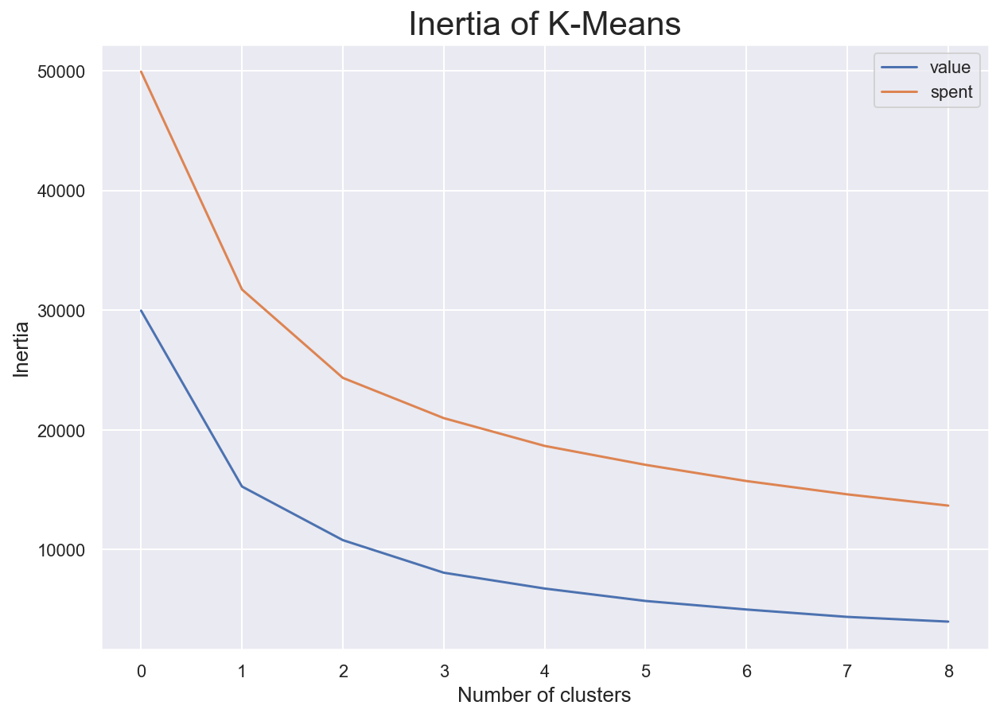

In [349]:
df_inertia.plot.line(figsize=(10,7))
plt.title("Inertia of K-Means", fontsize=21)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("Inertia", fontsize=13)
plt.show()

In [350]:
# Applying the right clustering (algorithm and number of clusters) for each perspective
kmeans_prod = KMeans(
    n_clusters=3,
    init='k-means++',
    n_init=20,
    random_state=42
)
value_labels = kmeans_prod.fit_predict(df_value)

kmeans_behav = KMeans(
    n_clusters=3,
    init='k-means++',
    n_init=20,
    random_state=42
)
spent_labels = kmeans_behav.fit_predict(df_spent)

df['value_labels'] = value_labels
df['spent_labels'] = spent_labels

In [351]:
# Count label frequencies (contigency table)
df.groupby(['value_labels', 'spent_labels'])\
    .size()\
    .to_frame()\
    .reset_index()\
    .pivot('value_labels', 'spent_labels', 0)

spent_labels,0,1,2
value_labels,,,
0,1162,1366,590
1,2013,1131,741
2,1143,1573,266


#### Merging Using HC

In [352]:
# Centroids of the concatenated cluster labels
df_centroids = df.groupby(['value_labels', 'spent_labels'])\
    [metric_features].mean()
df_centroids

MonthSal  CustMonVal  ClaimsRate  PremHousehold  \
value_labels spent_labels                                                    
0            0            -0.478451   -0.891343    0.941192      -0.628078   
             1            -0.939877   -0.558871    0.566790      -0.126537   
             2            -1.282644   -0.675838    0.775401       1.807477   
1            0             0.074612    0.865421   -1.266651      -0.598674   
             1            -0.040164    0.777013   -0.788270       0.061613   
             2            -0.487895    1.876433   -1.032447       1.856307   
2            0             0.753839   -0.803657    0.828527      -0.553601   
             1             1.098379   -0.481748    0.484499      -0.113154   
             2             0.992351   -0.515254    0.646001       1.529869   

                           PremHealth  PremLife  PremWork  Avg_Premiuns  
value_labels spent_labels                                                
0            0              -0.729737 -0.615347 -0.606722     -0.627699  
             1               0.923410  0.275494  0.268243     -0.121586  
             2              -0.114829  1.444313  1.431451      1.786932  
1            0              -0.754992 -0.584804 -0.580306     -0.595226  
             1               0.634132  0.062557  0.086231      0.073007  
             2              -0.083382  1.013398  1.078012      1.837810  
2            0              -0.718687 -0.541671 -0.542441     -0.556256  
             1               0.854185  0.146989  0.116731     -0.112138  
             2              -0.013036  0.864700  0.760332      1.530743

In [353]:
# Using Hierarchical clustering to merge the concatenated cluster centroids
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    distance_threshold=0, 
    n_clusters=None
)
hclust_labels = hclust.fit_predict(df_centroids)

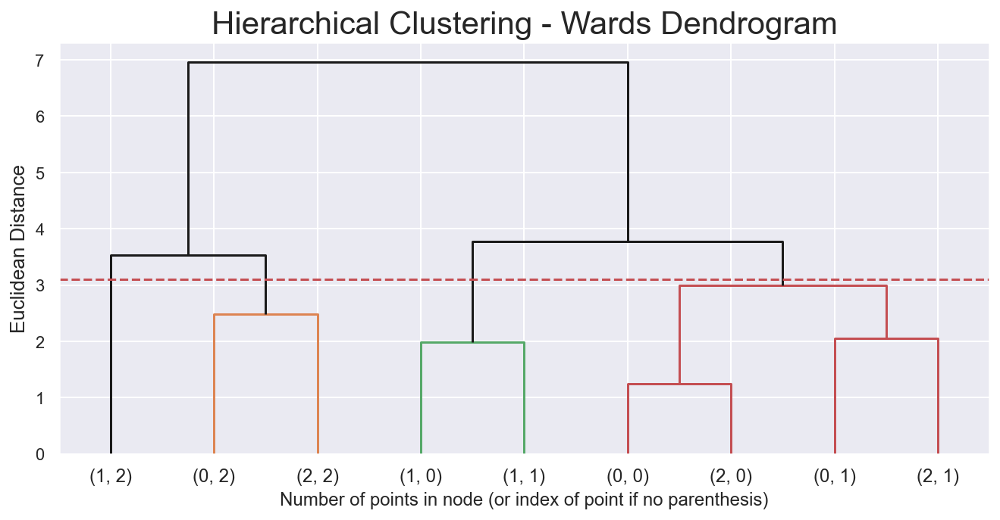

In [354]:
# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 3.1
dendrogram(linkage_matrix, truncate_mode='level', labels=df_centroids.index, p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - Wards Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [355]:
# Re-running the Hierarchical clustering based on the correct number of clusters
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=4
)
hclust_labels = hclust.fit_predict(df_centroids)
df_centroids['hclust_labels'] = hclust_labels

df_centroids  # centroid's cluster labels

MonthSal  CustMonVal  ClaimsRate  PremHousehold  \
value_labels spent_labels                                                    
0            0            -0.478451   -0.891343    0.941192      -0.628078   
             1            -0.939877   -0.558871    0.566790      -0.126537   
             2            -1.282644   -0.675838    0.775401       1.807477   
1            0             0.074612    0.865421   -1.266651      -0.598674   
             1            -0.040164    0.777013   -0.788270       0.061613   
             2            -0.487895    1.876433   -1.032447       1.856307   
2            0             0.753839   -0.803657    0.828527      -0.553601   
             1             1.098379   -0.481748    0.484499      -0.113154   
             2             0.992351   -0.515254    0.646001       1.529869   

                           PremHealth  PremLife  PremWork  Avg_Premiuns  \
value_labels spent_labels                                                 
0            0              -0.729737 -0.615347 -0.606722     -0.627699   
             1               0.923410  0.275494  0.268243     -0.121586   
             2              -0.114829  1.444313  1.431451      1.786932   
1            0              -0.754992 -0.584804 -0.580306     -0.595226   
             1               0.634132  0.062557  0.086231      0.073007   
             2              -0.083382  1.013398  1.078012      1.837810   
2            0              -0.718687 -0.541671 -0.542441     -0.556256   
             1               0.854185  0.146989  0.116731     -0.112138   
             2              -0.013036  0.864700  0.760332      1.530743   

                           hclust_labels  
value_labels spent_labels                 
0            0                         0  
             1                         0  
             2                         1  
1            0                         2  
             1                         2  
             2                         3  
2            0                         0  
             1                         0  
             2                         1

In [356]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids['hclust_labels'].to_dict()

df_ = df.copy()

# Mapping the hierarchical clusters on the centroids to the observations
df_['merged_labels'] = df_.apply(
    lambda row: cluster_mapper[
        (row['value_labels'], row['spent_labels'])
    ], axis=1
)

# Merged cluster centroids
df_.groupby('merged_labels').mean()[metric_features]

,MonthSal,CustMonVal,ClaimsRate,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns
merged_labels,,,,,,,,
0,0.142936,-0.662763,0.682117,-0.326742,0.178413,-0.138563,-0.147785,-0.325642
1,-0.575695,-0.625937,0.735190,1.721211,-0.083197,1.264200,1.222903,1.707321
2,0.033323,0.833618,-1.094562,-0.361147,-0.255278,-0.351927,-0.340531,-0.354840
3,-0.487895,1.876433,-1.032447,1.856307,-0.083382,1.013398,1.078012,1.837810


#### Cluster Analysis

In [357]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

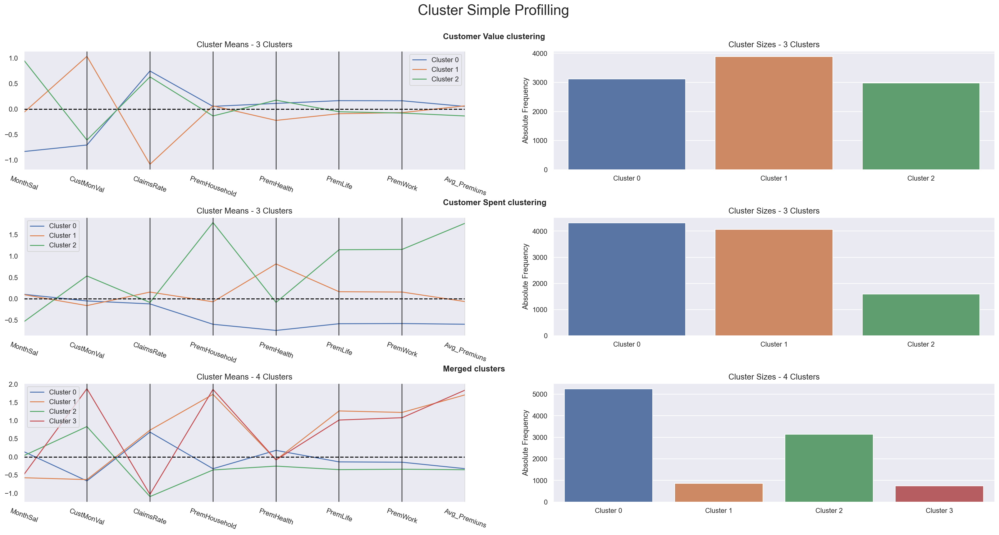

In [358]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    df = df_[metric_features.to_list() + ['value_labels', 'spent_labels', 'merged_labels']], 
    label_columns = ['value_labels', 'spent_labels', 'merged_labels'], 
    figsize = (28, 13), 
    compar_titles = ["Customer Value clustering", "Customer Spent clustering", "Merged clusters"]
)

<hr>
<a class="anchor" id="kmeansall">
    
# 10.4. Cluster Visualization with t-SNE - K-Means All Features
    
</a>

In [95]:
# This is step can be quite time consuming
two_dim = TSNE(random_state=42).fit_transform(df_kmeans_all[metric_features])

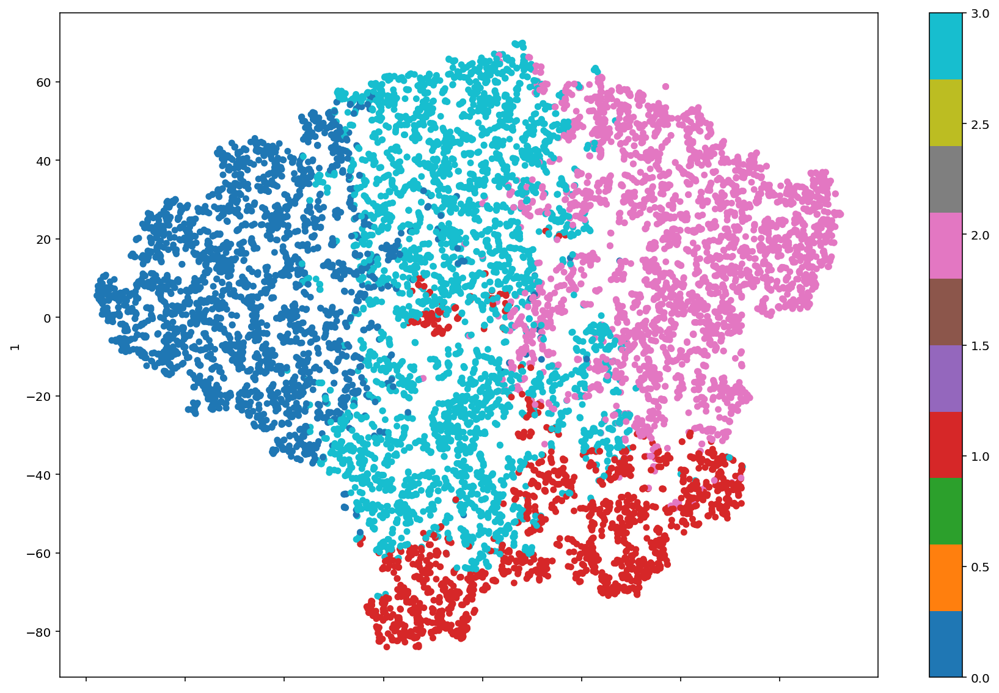

In [96]:
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=df_kmeans_all['labels'], colormap='tab10', figsize=(15,10))
plt.savefig(os.path.join( 'figures', 'tsne.png'), dpi=200)

plt.show()

<hr>
<a class="anchor" id="kmeansclass">
    
# 10.5. Classification of Outliers
    
</a>

### Using a Decision Tree
We get the normalized total reduction of the criterion (gini or entropy) brought by that feature (also known as Gini importance).

In [109]:
# Preparing the data
X = df_kmeans_all.drop(columns=['labels'])
X = X[metric_features]
y = df_kmeans_all.labels

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Fitting the decision tree
dt = DecisionTreeClassifier(random_state=42, max_depth=3)
dt.fit(X_train, y_train)
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly".format(dt.score(X_test, y_test)*100))

It is estimated that in average, we are able to predict 82.97% of the customers correctly


In [110]:
# scaling the metric features for outliers
scaled_feat_out = scaler.fit_transform(df_outliers[metric_features])
df_outliers[metric_features] = scaled_feat_out

In [111]:
# Predicting the cluster labels of the outliers

df_outliers['labels'] = dt.predict(df_outliers[metric_features])
df_outliers.head()

,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Avg_Premiuns,labels
CustID,,,,,,,,,,,,,
146.0,b'1 - Basic',0.166528,1.0,True,0.087199,-0.101060,144.36,-0.385690,0.081853,-0.966416,-0.813813,-0.308367,0
288.0,b'2 - High School',0.069073,3.0,True,0.151986,-0.168712,139.58,-0.325317,-0.000310,-0.719226,-0.235074,-0.280287,0
502.0,b'2 - High School',0.147361,1.0,True,0.152609,-0.168712,160.03,-0.331073,-0.071206,-0.286692,0.200216,-0.277474,0
559.0,b'3 - BSc/MSc',0.106327,1.0,False,0.093643,-0.108309,276.72,-0.290102,-0.119031,0.517701,-0.820941,-0.267384,0
909.0,b'3 - BSc/MSc',-0.005435,3.0,True,0.209571,-0.168712,129.58,0.183537,-0.023042,-1.312229,-0.511955,-0.020489,0


In [112]:
df_outliers.labels.value_counts()

0    269
1     42
Name: labels, dtype: int64